# Descrição do projeto

### Esse projeto tem como objetivo prever o valor do PIB de uma Pais a partir de informações económicas, sociais e localização

# Sumario de informações

| **Variável**                          | **Descrição da variável**                                                                 |
|---------------------------------------|-------------------------------------------------------------------------------------------|
| Country                               | Nome do país.                                                                             |
| Density (P/Km2)                       | Densidade populacional medida em pessoas por quilômetro quadrado.                        |
| Abbreviation                          | Abreviação ou código que representa o país.                                              |
| Agricultural Land (%)                 | Porcentagem de área de terra usada para fins agrícolas.                                   |
| Land Area (Km2)                       | Área total do país em quilômetros quadrados.                                             |
| Armed Forces Size                     | Tamanho das forças armadas no país.                                                      |
| Birth Rate                            | Número de nascimentos por 1.000 habitantes por ano.                                      |
| Calling Code                          | Código de chamada internacional para o país.                                             |
| Capital/Major City                    | Nome da capital ou cidade principal.                                                     |
| CO2 Emissions                         | Emissões de dióxido de carbono em toneladas.                                             |
| CPI                                   | Índice de Preços ao Consumidor, uma medida de inflação e poder de compra.                |
| CPI Change (%)                        | Variação percentual do Índice de Preços ao Consumidor em comparação ao ano anterior.     |
| Currency_Code                         | Código da moeda usado no país.                                                           |
| Fertility Rate                        | Número médio de filhos nascidos de uma mulher durante sua vida.                          |
| Forested Area (%)                     | Porcentagem de área terrestre coberta por florestas.                                     |
| Gasoline_Price                        | Preço da gasolina por litro em moeda local.                                              |
| GDP                                   | Produto Interno Bruto, valor total de bens e serviços produzidos no país.                |
| Gross Primary Education Enrollment (%)| Taxa bruta de matrícula no ensino fundamental.                                           |
| Gross Tertiary Education Enrollment (%)| Taxa bruta de matrícula no ensino superior.                                             |
| Infant Mortality                      | Número de mortes por 1.000 nascidos vivos antes de completar um ano de idade.            |
| Largest City                          | Nome da maior cidade do país.                                                            |
| Life Expectancy                       | Número médio de anos que se espera que um recém-nascido viva.                            |
| Maternal Mortality Ratio              | Número de mortes maternas por 100.000 nascidos vivos.                                    |
| Minimum Wage                          | Nível de salário mínimo em moeda local.                                                  |
| Official Language                     | Língua(s) oficial(ais) falada(s) no país.                                                |
| Out of Pocket Health Expenditure (%)  | Porcentagem das despesas totais com saúde pagas do próprio bolso pelos indivíduos.        |
| Physicians per Thousand               | Número de médicos por mil pessoas.                                                       |
| Population                            | População total do país.                                                                 |
| Population Labor Force Participation (%)| Porcentagem da população que faz parte da força de trabalho.                            |
| Tax Revenue (%)                       | Receita tributária como porcentagem do PIB.                                              |
| Total Tax Rate                        | Carga tributária geral como porcentagem dos lucros comerciais.                           |
| Unemployment Rate                     | Porcentagem da força de trabalho que está desempregada.                                  |
| Urban Population                      | Porcentagem da população que vive em áreas urbanas.                                      |
| Latitude                              | Coordenada de latitude da localização do país.                                           |
| Longitude                             | Coordenada de longitude da localização do país.                                          |
ação do país.m de longitude da localização do país.

# Importar Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import lilliefors
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import het_breuschpagan
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import Lasso

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format

# Importar base de dados

In [3]:
df = pd.read_csv("world-data-2023.csv")
df.head(3)

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,CPI,CPI Change (%),Currency-Code,Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Largest city,Life expectancy,Maternal mortality ratio,Minimum wage,Official language,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.00,Kabul,"8,672",149.9,2.30%,AFN,4.47,2.10%,$0.70,"$19,101,353,833",104.00%,9.70%,47.90,Kabul,64.50,638.00,$0.43,Pashto,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.94,67.71
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.00,Tirana,"4,536",119.05,1.40%,ALL,1.62,28.10%,$1.36,"$15,278,077,447",107.00%,55.00%,7.80,Tirana,78.50,15.00,$1.12,Albanian,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.15,20.17
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.00,Algiers,"150,006",151.36,2.00%,DZD,3.02,0.80%,$0.28,"$169,988,236,398",109.90%,51.40%,20.10,Algiers,76.70,112.00,$0.95,Arabic,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.03,1.66


In [4]:
new_var = df.shape
new_var

(195, 35)

# Tratamento de caracteres especiais e conversão de tipo de dados

In [5]:
df["Density\n(P/Km2)"] = df["Density\n(P/Km2)"].str.replace(",", ".", regex=False)
df['Density\n(P/Km2)'] = df['Density\n(P/Km2)'].astype(float)
df["Agricultural Land( %)"] = df["Agricultural Land( %)"].str.replace("%", "", regex=False)
df["Agricultural Land( %)"] = df["Agricultural Land( %)"].astype(float)
df["Land Area(Km2)"] = df["Land Area(Km2)"].str.replace(",", "", regex=False)
df["Land Area(Km2)"] = df["Land Area(Km2)"].astype(float)
df["Armed Forces size"] = df["Armed Forces size"].str.replace(",", "", regex=False)
df["Armed Forces size"] = df["Armed Forces size"].astype(float)
df["Co2-Emissions"] = df["Co2-Emissions"].str.replace(",", "", regex=False)
df["Co2-Emissions"] = df["Co2-Emissions"].astype(float)
df["CPI"] = df["CPI"].str.replace(",", "", regex=False)
df["CPI"] = df["CPI"].astype(float)
df["CPI Change (%)"] = df["CPI Change (%)"].str.replace("%", "", regex=False)
df["CPI Change (%)"] = df["CPI Change (%)"].astype(float)
df["Forested Area (%)"] = df["Forested Area (%)"].str.replace("%", "", regex=False)
df["Forested Area (%)"] = df["Forested Area (%)"].astype(float)
df["Gasoline Price"] = df["Gasoline Price"].str.replace("$", "", regex=False)
df["Gasoline Price"] = df["Gasoline Price"].astype(float)
df["GDP"] = df["GDP"].str.replace("$", "", regex=False)
df["GDP"] = df["GDP"].str.replace(",", "", regex=False)
df["GDP"] = df["GDP"].astype(float)
df["Gross primary education enrollment (%)"] = df["Gross primary education enrollment (%)"].str.replace("%", "", regex=False)
df["Gross primary education enrollment (%)"] = df["Gross primary education enrollment (%)"].astype(float)
df["Gross tertiary education enrollment (%)"] = df["Gross tertiary education enrollment (%)"].str.replace("%", "", regex=False)
df["Gross tertiary education enrollment (%)"] = df["Gross tertiary education enrollment (%)"].astype(float)
df["Minimum wage"] = df["Minimum wage"].str.replace("$", "", regex=False)
df["Minimum wage"] = df["Minimum wage"].astype(float)
df["Out of pocket health expenditure"] = df["Out of pocket health expenditure"].str.replace("%", "", regex=False)
df["Out of pocket health expenditure"] = df["Out of pocket health expenditure"].astype(float)
df["Population"] = df["Population"].str.replace(",", "", regex=False)
df["Population"] = df["Population"].astype(float)
df["Population: Labor force participation (%)"] = df["Population: Labor force participation (%)"].str.replace("%", "", regex=False)
df["Population: Labor force participation (%)"] = df["Population: Labor force participation (%)"].astype(float)
df["Tax revenue (%)"] = df["Tax revenue (%)"].str.replace("%", "", regex=False)
df["Tax revenue (%)"] = df["Tax revenue (%)"].astype(float)
df["Total tax rate"] = df["Total tax rate"].str.replace("%", "", regex=False)
df["Total tax rate"] = df["Total tax rate"].astype(float)
df["Unemployment rate"] = df["Unemployment rate"].str.replace("%", "", regex=False)
df["Unemployment rate"] = df["Unemployment rate"].astype(float)
df["Urban_population"] = df["Urban_population"].str.replace(",", "", regex=False)
df["Urban_population"] = df["Urban_population"].astype(float)

# Checar valores nulos e fazer imputação de valores ausentes

In [6]:
# Checar valores Nulos
df.isnull().sum()

Country                                       0
Density\n(P/Km2)                              0
Abbreviation                                  7
Agricultural Land( %)                         7
Land Area(Km2)                                1
Armed Forces size                            24
Birth Rate                                    6
Calling Code                                  1
Capital/Major City                            3
Co2-Emissions                                 7
CPI                                          17
CPI Change (%)                               16
Currency-Code                                15
Fertility Rate                                7
Forested Area (%)                             7
Gasoline Price                               20
GDP                                           2
Gross primary education enrollment (%)        7
Gross tertiary education enrollment (%)      12
Infant mortality                              6
Largest city                            

In [7]:
df['Agricultural Land( %)'] = df['Agricultural Land( %)'].fillna(df['Agricultural Land( %)'].mean())
df = df.dropna(subset=['Land Area(Km2)'])
df['Armed Forces size'] = df['Armed Forces size'].fillna(df['Armed Forces size'].median())
df['Birth Rate'] = df['Birth Rate'].fillna(df['Birth Rate'].median())
df['Co2-Emissions'] = df['Co2-Emissions'].fillna(df['Birth Rate'].median())
df['CPI'] = df['CPI'].fillna(df['CPI'].median())
df['CPI Change (%)'] = df['CPI Change (%)'].fillna(df['CPI Change (%)'].median())
df['Fertility Rate'] = df['Fertility Rate'].fillna(df['Fertility Rate'].median())
df['Forested Area (%)'] = df['Forested Area (%)'].fillna(df['Forested Area (%)'].mean())
df['Gasoline Price'] = df['Gasoline Price'].fillna(df['Gasoline Price'].mean())
df = df.dropna(subset=['GDP'])
df['Gross primary education enrollment (%)'] = df['Gross primary education enrollment (%)'].fillna(df['Gross primary education enrollment (%)'].median())
df['Gross tertiary education enrollment (%)'] = df['Gross tertiary education enrollment (%)'].fillna(df['Gross tertiary education enrollment (%)'].median())
df['Infant mortality'] = df['Infant mortality'].fillna(df['Infant mortality'].median())
df['Life expectancy'] = df['Life expectancy'].fillna(df['Life expectancy'].median())
df['Maternal mortality ratio'] = df['Maternal mortality ratio'].fillna(df['Maternal mortality ratio'].median())
df['Minimum wage'] = df['Minimum wage'].fillna(df['Minimum wage'].median())
df['Out of pocket health expenditure'] = df['Out of pocket health expenditure'].fillna(df['Out of pocket health expenditure'].median())
df['Physicians per thousand'] = df['Physicians per thousand'].fillna(df['Physicians per thousand'].median())
df['Population: Labor force participation (%)'] = df['Population: Labor force participation (%)'].fillna(df['Population: Labor force participation (%)'].median())
df['Tax revenue (%)'] = df['Tax revenue (%)'].fillna(df['Tax revenue (%)'].median())
df['Total tax rate'] = df['Total tax rate'].fillna(df['Total tax rate'].median())
df['Unemployment rate'] = df['Unemployment rate'].fillna(df['Unemployment rate'].median())
df['Urban_population'] = df['Urban_population'].fillna(df['Urban_population'].median())
df = df.dropna(subset=['Latitude'])




df.shape

(192, 35)

In [8]:
df.columns

Index(['Country', 'Density\n(P/Km2)', 'Abbreviation', 'Agricultural Land( %)',
       'Land Area(Km2)', 'Armed Forces size', 'Birth Rate', 'Calling Code',
       'Capital/Major City', 'Co2-Emissions', 'CPI', 'CPI Change (%)',
       'Currency-Code', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Largest city', 'Life expectancy', 'Maternal mortality ratio',
       'Minimum wage', 'Official language', 'Out of pocket health expenditure',
       'Physicians per thousand', 'Population',
       'Population: Labor force participation (%)', 'Tax revenue (%)',
       'Total tax rate', 'Unemployment rate', 'Urban_population', 'Latitude',
       'Longitude'],
      dtype='object')

# Renomear variáveis

In [9]:
df = df.rename(columns={"Country" : "País"})
df = df.rename(columns={"Density\n(P/Km2)" : "DensidadeP/Km2"})
df = df.rename(columns={"Abbreviation" : "Abreviacao"})
df = df.rename(columns={"Agricultural Land( %)" : "TerraAgrícolaPerc"})
df = df.rename(columns={"Land Area(Km2)" : "AreaTerrestreKm2"})
df = df.rename(columns={"Armed Forces size)" : "TamanhoForçasArmadas"})
df = df.rename(columns={"Birth Rate" : "TaxaNatalidade"})
df = df.rename(columns={"Calling Code" : "CódigoChamada"})
df = df.rename(columns={"Capital/Major City" : "Capital/CidadePrincipal"})
df = df.rename(columns={"Co2-Emissions" : "EmissoesCO2"})
df = df.rename(columns={"CPI" : "IPC"})
df = df.rename(columns={"CPI Change (%)" : "VariacaoIPC_Perc"})
df = df.rename(columns={"Currency-Code" : "Moeda"})
df = df.rename(columns={"Fertility Rate" : "TaxaFertilidade"})
df = df.rename(columns={"Forested Area (%)" : "AreaFlorestalPerc"})
df = df.rename(columns={"Gasoline Price" : "PrecoGasolina"})
df = df.rename(columns={"GDP" : "PIB"})
df = df.rename(columns={"Gross primary education enrollment (%)" : "MatriculaBrutaEnsinoFundamentalPerc"})
df = df.rename(columns={"Gross tertiary education enrollment (%)" : "MatriculaBrutaEnsinoSuperiorPerc"})
df = df.rename(columns={"Infant mortality" : "MortalidadeInfantil"})
df = df.rename(columns={"Largest city" : "MaiorCidade"})
df = df.rename(columns={"Life expectancy" : "ExpectativaVida"})
df = df.rename(columns={"Maternal mortality ratio" : "RazaoMortalidadeMaterna"})
df = df.rename(columns={"Minimum wage" : "Salário mínimo"})
df = df.rename(columns={"Official language" : "LínguaOficial"})
df = df.rename(columns={"Out of pocket health expenditure" : "DespesasSaudePagasPróprioBolsoPerc"})
df = df.rename(columns={"Physicians per thousand" : "MedicosPMil"})
df = df.rename(columns={"Population" : "Populacao"})
df = df.rename(columns={"Population: Labor force participation (%)" : "Populacao/ ParticipacaoForçaTrabalho (%)"})
df = df.rename(columns={"Tax revenue (%)" : "ReceitaTributariaPerc"})
df = df.rename(columns={"Total tax rate" : "TaxaTotalImposto"})
df = df.rename(columns={"Unemployment rate" : "PopulacaoUrbana"})

In [10]:
df.info();

<class 'pandas.core.frame.DataFrame'>
Index: 192 entries, 0 to 194
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   País                                      192 non-null    object 
 1   DensidadeP/Km2                            192 non-null    float64
 2   Abreviacao                                187 non-null    object 
 3   TerraAgrícolaPerc                         192 non-null    float64
 4   AreaTerrestreKm2                          192 non-null    float64
 5   Armed Forces size                         192 non-null    float64
 6   TaxaNatalidade                            192 non-null    float64
 7   CódigoChamada                             192 non-null    float64
 8   Capital/CidadePrincipal                   190 non-null    object 
 9   EmissoesCO2                               192 non-null    float64
 10  IPC                                       1

In [11]:
df.head(3)

,País,DensidadeP/Km2,Abreviacao,TerraAgrícolaPerc,AreaTerrestreKm2,Armed Forces size,TaxaNatalidade,CódigoChamada,Capital/CidadePrincipal,EmissoesCO2,IPC,VariacaoIPC_Perc,Moeda,TaxaFertilidade,AreaFlorestalPerc,PrecoGasolina,PIB,MatriculaBrutaEnsinoFundamentalPerc,MatriculaBrutaEnsinoSuperiorPerc,MortalidadeInfantil,MaiorCidade,ExpectativaVida,RazaoMortalidadeMaterna,Salário mínimo,LínguaOficial,DespesasSaudePagasPróprioBolsoPerc,MedicosPMil,Populacao,Populacao/ ParticipacaoForçaTrabalho (%),ReceitaTributariaPerc,TaxaTotalImposto,PopulacaoUrbana,Urban_population,Latitude,Longitude
0,Afghanistan,60.00,AF,58.10,652230.00,323000.00,32.49,93.00,Kabul,8672.00,149.90,2.30,AFN,4.47,2.10,0.70,19101353833.00,104.00,9.70,47.90,Kabul,64.50,638.00,0.43,Pashto,78.40,0.28,38041754.00,48.90,9.30,71.40,11.12,9797273.00,33.94,67.71
1,Albania,105.00,AL,43.10,28748.00,9000.00,11.78,355.00,Tirana,4536.00,119.05,1.40,ALL,1.62,28.10,1.36,15278077447.00,107.00,55.00,7.80,Tirana,78.50,15.00,1.12,Albanian,56.90,1.20,2854191.00,55.70,18.60,36.60,12.33,1747593.00,41.15,20.17
2,Algeria,18.00,DZ,17.40,2381741.00,317000.00,24.28,213.00,Algiers,150006.00,151.36,2.00,DZD,3.02,0.80,0.28,169988236398.00,109.90,51.40,20.10,Algiers,76.70,112.00,0.95,Arabic,28.10,1.72,43053054.00,41.20,37.20,66.10,11.70,31510100.00,28.03,1.66


In [12]:
df.describe()

,DensidadeP/Km2,TerraAgrícolaPerc,AreaTerrestreKm2,Armed Forces size,TaxaNatalidade,CódigoChamada,EmissoesCO2,IPC,VariacaoIPC_Perc,TaxaFertilidade,AreaFlorestalPerc,PrecoGasolina,PIB,MatriculaBrutaEnsinoFundamentalPerc,MatriculaBrutaEnsinoSuperiorPerc,MortalidadeInfantil,ExpectativaVida,RazaoMortalidadeMaterna,Salário mínimo,DespesasSaudePagasPróprioBolsoPerc,MedicosPMil,Populacao,Populacao/ ParticipacaoForçaTrabalho (%),ReceitaTributariaPerc,TaxaTotalImposto,PopulacaoUrbana,Urban_population,Latitude,Longitude
count,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00,192.00
mean,131.00,39.06,696802.93,145401.04,20.11,361.08,174094.93,185.40,6.39,2.68,31.89,1.00,479779583091.18,102.45,37.74,21.16,72.32,153.84,1.94,32.70,1.84,39790260.03,62.74,16.55,40.65,6.72,22144475.23,18.91,20.19
std,149.42,21.54,1930342.73,361275.36,9.84,324.80,830351.12,383.49,23.63,1.27,23.48,0.35,2177577473187.98,13.01,28.55,19.42,7.39,228.17,2.67,18.91,1.66,145794104.14,10.05,6.53,20.08,4.86,75049771.32,24.01,67.05
min,1.26,0.60,2.00,0.00,5.90,1.00,11.00,99.03,-4.30,0.98,0.00,0.00,47271463.00,23.40,0.80,1.40,52.80,2.00,0.01,0.20,0.01,10084.00,38.00,0.00,8.00,0.09,5464.00,-40.90,-175.20
25%,26.25,22.10,26181.75,12750.00,11.38,81.75,2020.00,114.42,1.00,1.71,11.15,0.79,8487891267.75,99.22,12.55,6.07,67.25,15.75,0.53,17.75,0.36,2115937.50,56.92,12.38,30.77,3.49,1245652.00,4.45,-8.23
50%,82.00,39.25,125454.00,31000.00,17.95,255.50,10942.50,125.34,2.30,2.25,32.02,1.00,36266259213.00,102.55,31.20,14.00,73.20,53.00,1.04,30.70,1.46,8965183.50,62.45,16.30,37.20,5.36,4678103.50,17.13,20.97
75%,155.75,55.02,541067.75,124500.00,28.35,507.50,62689.75,155.57,3.73,3.56,47.17,1.19,234992051113.00,107.70,61.75,32.02,77.33,178.50,1.65,43.82,2.90,28747013.00,68.42,20.47,47.50,8.82,14795250.25,40.09,49.03
max,784.00,82.60,17098240.00,3031000.00,46.08,1876.00,9893038.00,4583.71,254.90,6.91,98.30,2.00,21427700000000.00,142.50,136.60,84.50,85.40,1150.00,13.59,81.60,8.42,1397715000.00,86.80,37.20,219.60,28.18,842933962.00,64.96,178.07


In [13]:
df_f = df.select_dtypes(include=["float"])

# Analisar correlação das variáveis e plotar gráficos

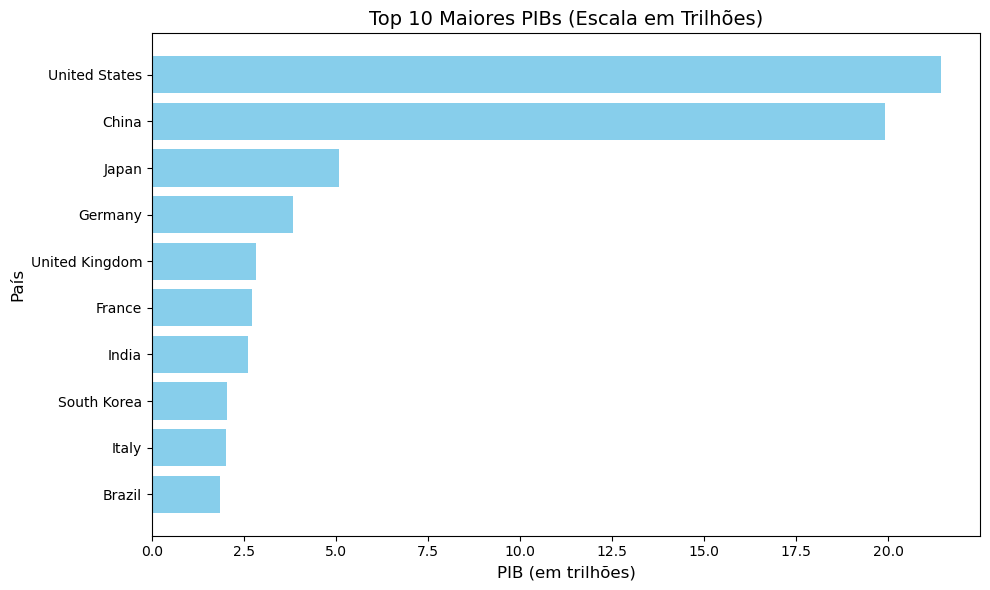

In [14]:
df_sorted = df.sort_values(by="PIB", ascending=False)

top_10 = df_sorted.head(10)

top_10["PIB_Trilhões"] = top_10["PIB"] / 1e12

plt.figure(figsize=(10, 6))
plt.barh(top_10["País"], top_10["PIB_Trilhões"], color="skyblue")
plt.xlabel("PIB (em trilhões)", fontsize=12)
plt.ylabel("País", fontsize=12)
plt.title("Top 10 Maiores PIBs (Escala em Trilhões)", fontsize=14)
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

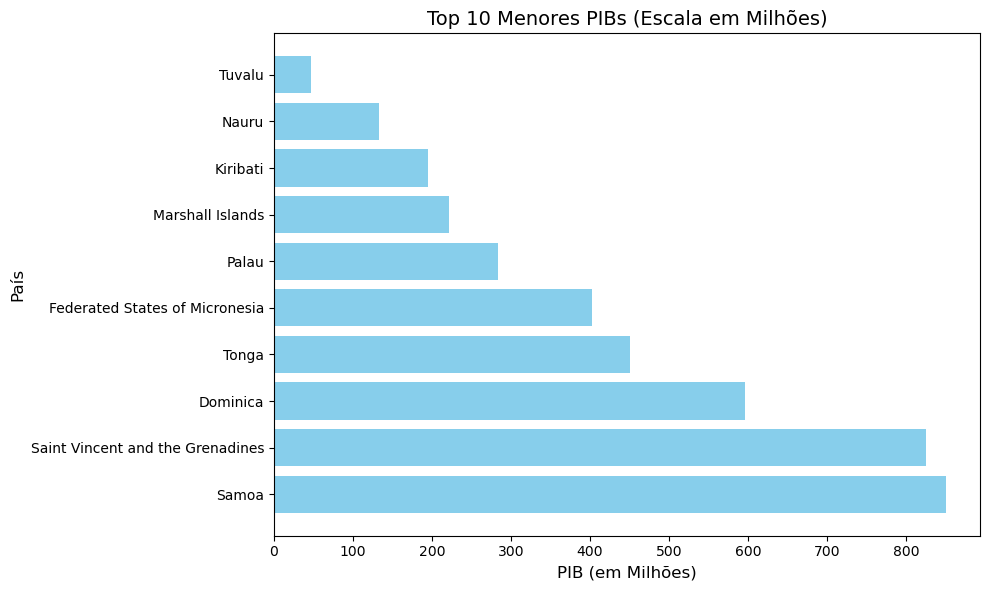

In [15]:
df_sorted = df.sort_values(by="PIB", ascending=True)

top_10 = df_sorted.head(10)

top_10["PIB_Trilhões"] = top_10["PIB"] / 1e6

plt.figure(figsize=(10, 6))
plt.barh(top_10["País"], top_10["PIB_Trilhões"], color="skyblue")
plt.xlabel("PIB (em Milhões)", fontsize=12)
plt.ylabel("País", fontsize=12)
plt.title("Top 10 Menores PIBs (Escala em Milhões)", fontsize=14)
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

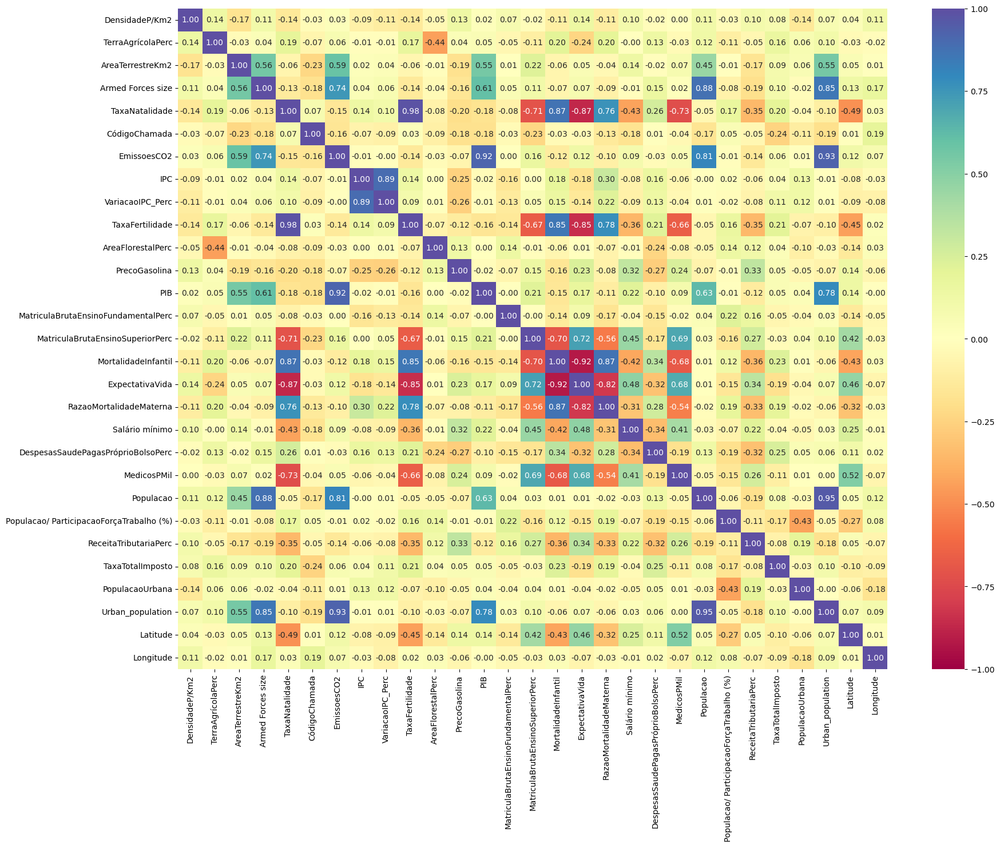

In [16]:
plt.figure(figsize=(20, 15))
sns.heatmap(data=df_f.corr(), annot=True, vmax=1, vmin=-1, cmap='Spectral', fmt=".2f");

In [17]:
correlation_matrix = df_f.corr()

corr_pairs = correlation_matrix.unstack()

strong_corr = corr_pairs[(corr_pairs >= 0.7) | (corr_pairs <= -0.7)]

strong_corr = strong_corr.drop_duplicates().sort_values(ascending=False)

strong_corr_df = strong_corr.reset_index()
strong_corr_df.columns = ['Variable 1', 'Variable 2', 'Correlation']
print(strong_corr_df)

                          Variable 1                        Variable 2  \
0                     DensidadeP/Km2                    DensidadeP/Km2   
1                     TaxaNatalidade                   TaxaFertilidade   
2                          Populacao                  Urban_population   
3                        EmissoesCO2                  Urban_population   
4                        EmissoesCO2                               PIB   
5                                IPC                  VariacaoIPC_Perc   
6                  Armed Forces size                         Populacao   
7                MortalidadeInfantil           RazaoMortalidadeMaterna   
8                     TaxaNatalidade               MortalidadeInfantil   
9                    TaxaFertilidade               MortalidadeInfantil   
10                 Armed Forces size                  Urban_population   
11                       EmissoesCO2                         Populacao   
12                               PIB  

# Análise
  Acima temos indicados os dados que destacam as relações fortes positivas quanto negativas considerando ≥ 0.8 ou ≤ -0.8.
  As relações positivas indicam que quando uma variável aumenta a outra tende a aumentar, e nas relações negativas, indica que quando uma variável aumenta a outra tende a diminuir, ou seja uma relação inversa.

**Relações Positivas**

DensidadeP/Km2 com DensidadeP/Km2 (1.00): Uma variável comparada consigo mesma terá correlação máxima.

Taxa de Natalidade e Taxa de Fertilidade (0.98): Uma maior taxa de fertilidade está fortemente associada a uma maior taxa de natalidade, o que faz sentido, pois ambas medem aspectos relacionados ao número de nascimentos.

População e Urban Population (0.95): Quanto maior a população total, maior será a população urbana, refletindo uma concentração populacional nas áreas urbanas.

Emissões de CO2 com Urban Population (0.93): Populações urbanas maiores estão associadas a maiores emissões de CO2, devido ao aumento de atividades industriais, transporte e consumo de energia.

Emissões de CO2 com PIB (0.92): Economias maiores (PIB mais alto) tendem a emitir mais CO2, indicando a relação entre crescimento econômico e impacto ambiental.

Mortalidade Infantil e Razão de Mortalidade Materna (0.87): Esses indicadores refletem a qualidade do sistema de saúde; onde a mortalidade infantil é alta, a mortalidade materna também tende a ser alta.

**Relações Negativas**

Expectativa de Vida e Taxa de Mortalidade Infantil (-0.92): Regiões com menor mortalidade infantil tendem a ter maior expectativa de vida, o que é esperado, já que a mortalidade infantil reduz a média de vida.

Expectativa de Vida e Taxa de Fertilidade (-0.85): Países com alta taxa de fertilidade tendem a ter menor expectativa de vida, geralmente correlacionado com níveis de desenvolvimento socioeconômico mais baixos.

Expectativa de Vida e Taxa de Natalidade (-0.87): Sociedades com alta taxa de natalidade geralmente têm menor expectativa de vida devido a fatores como saúde pública precária e menor desenvolvimento econômico.

### Implicações e Insights
Relações Econômicas e Ambientais:

A correlação entre Emissões de CO2, PIB e Urban Population reflete o impacto ambiental do crescimento econômico e da urbanização. Pode indicar a necessidade de políticas sustentáveis em economias emergentes.
Saúde e Desenvolvimento:

A forte relação negativa entre Expectativa de Vida e indicadores como Mortalidade Infantil e Taxa de Natalidade/Fertilidade sugere que esses fatores estão diretamente relacionados ao nível de desenvolvimento socioeconômico e à qualidade dos sistemas de saúde.
Militares e População:

A correlação positiva entre Armed Forces size e População (0.88) sugere que países com maiores populações tendem a ter forças armadas maiores, provavelmente devido a demandas de segurança ou contexto geopolítico.

###Conclusões
As correlações destacam padrões significativos entre variáveis econômicas, sociais e de saúde pública.
Essas relações podem ajudar a priorizar políticas públicas, como:
Reduzir emissões enquanto promove crescimento econômico.
Investir em saúde para aumentar a expectativa de vida.
Promover o planejamento urbano sustentável para mitigar impactos ambientais.

In [18]:
sns.pairplot(df_f, corner=True)
plt.suptitle("Análise Gráfica dos Dados", y=1.02)
plt.show()

In [18]:
def plot_violin_all(df):

    for column in df.columns:
        if pd.api.types.is_numeric_dtype(df[column]):
            print(f"Plotando gráfico para a variável: {column}")
            fig = px.violin(df, y=column, box=True, points='all', title=f"Violin Plot - {column}")
            fig.show()
        else:
            print(f"Variável '{column}' não é numérica. Pulando...")

Plotando gráfico para a variável: DensidadeP/Km2


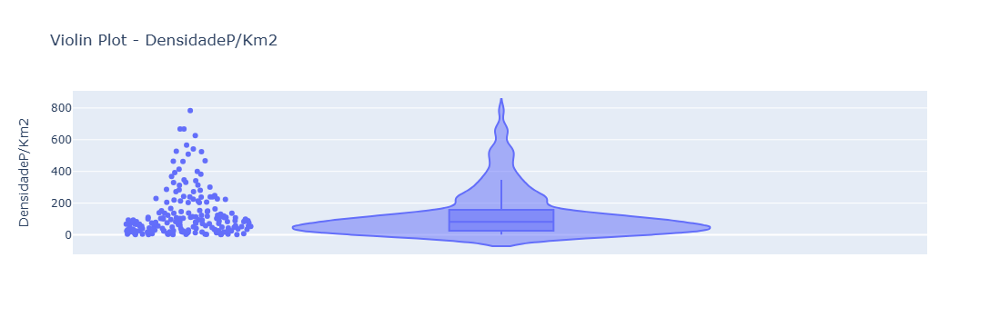

Plotando gráfico para a variável: TerraAgrícolaPerc


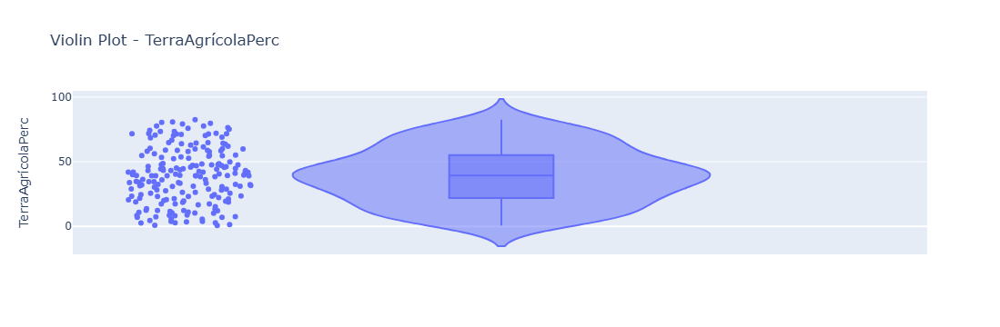

Plotando gráfico para a variável: AreaTerrestreKm2


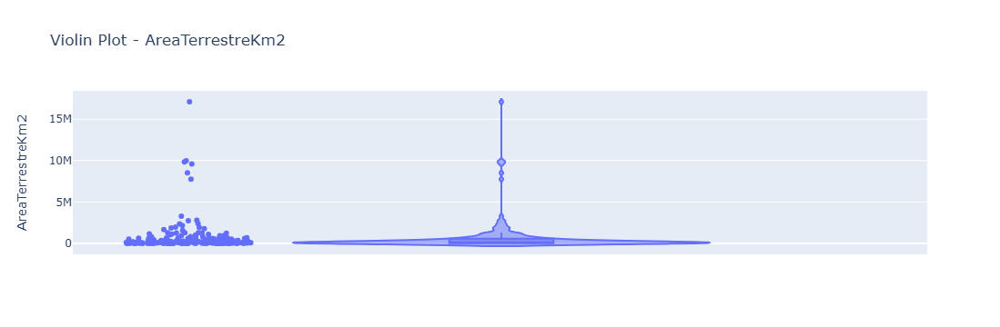

Plotando gráfico para a variável: Armed Forces size


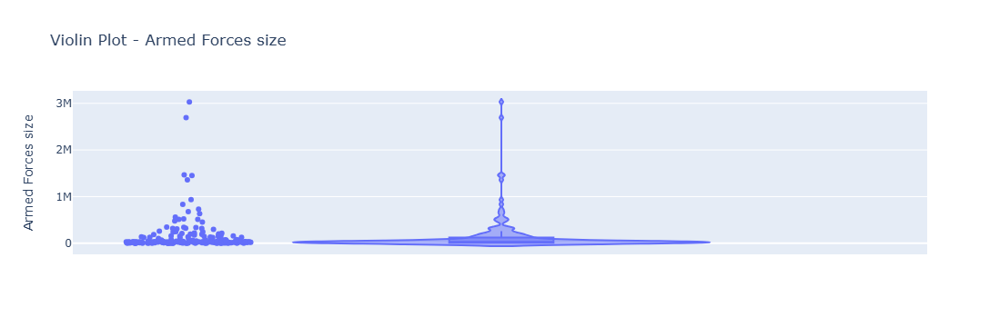

Plotando gráfico para a variável: TaxaNatalidade


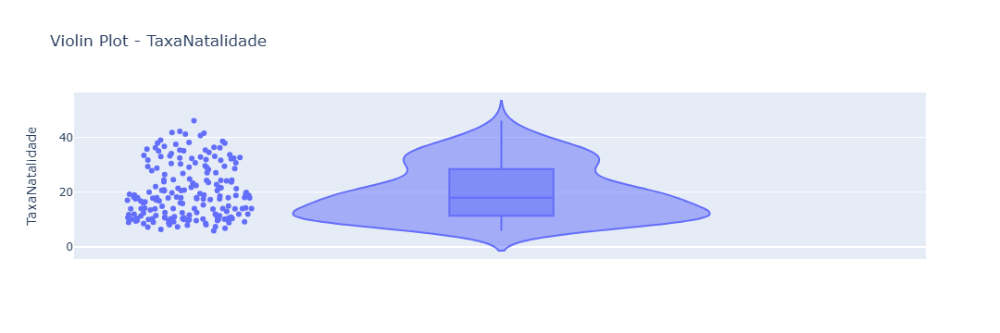

Plotando gráfico para a variável: CódigoChamada


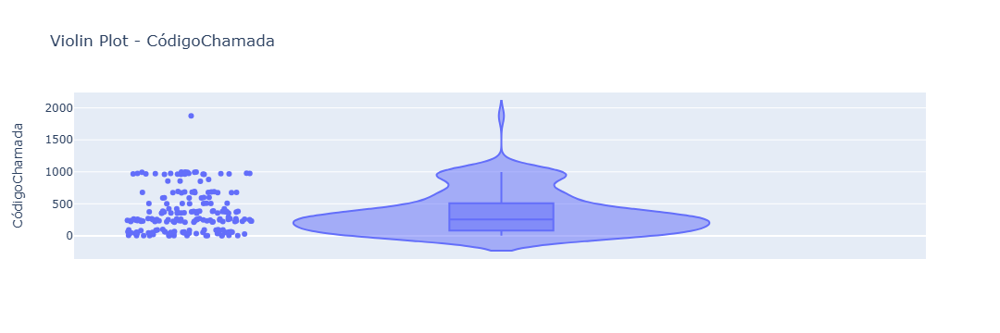

Plotando gráfico para a variável: EmissoesCO2


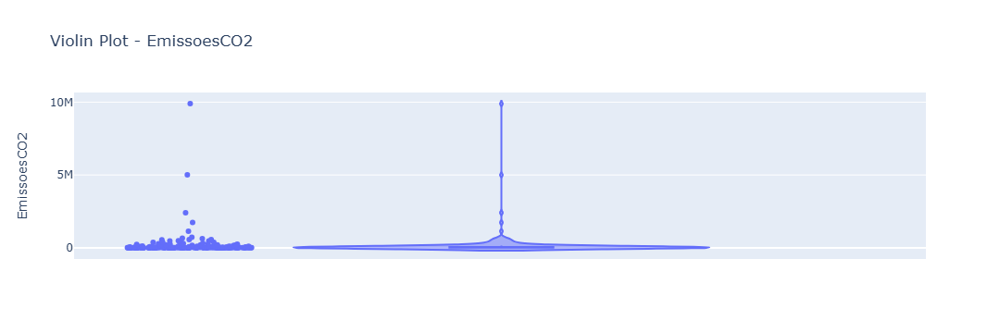

Plotando gráfico para a variável: IPC


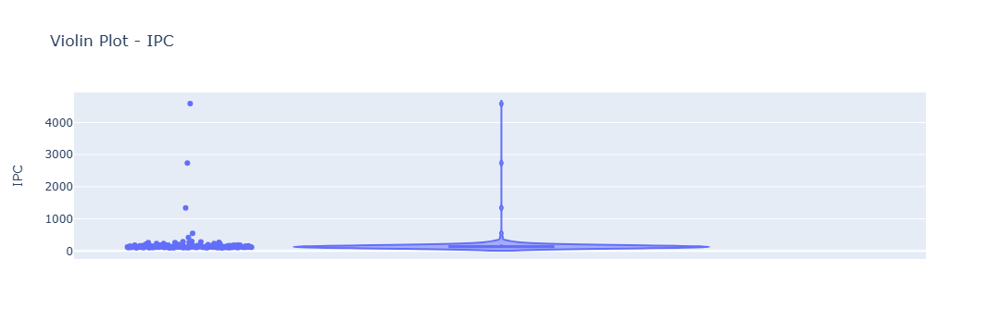

Plotando gráfico para a variável: VariacaoIPC_Perc


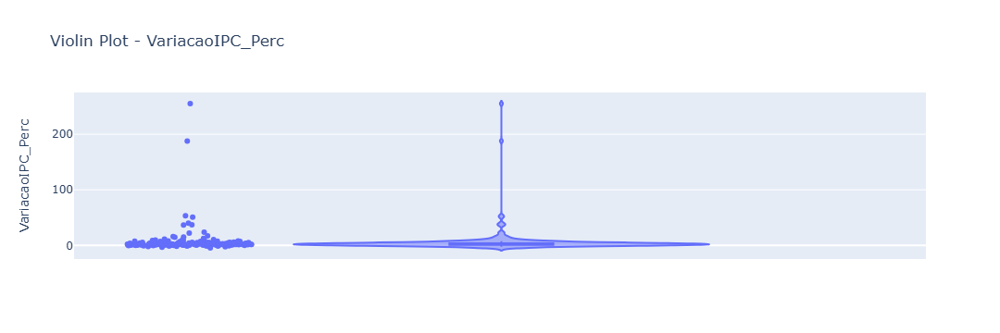

Plotando gráfico para a variável: TaxaFertilidade


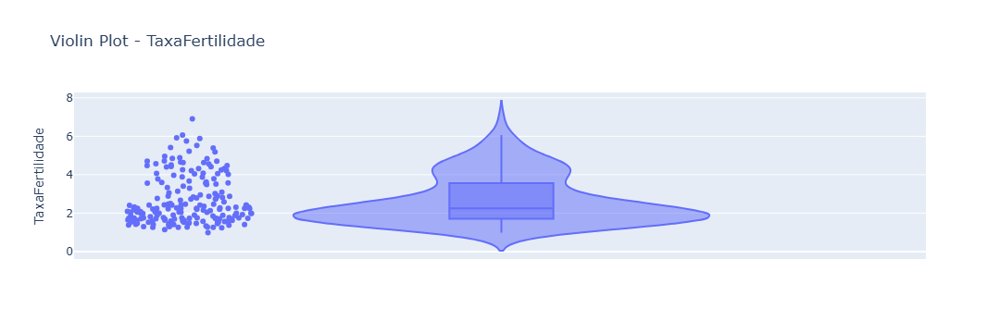

Plotando gráfico para a variável: AreaFlorestalPerc


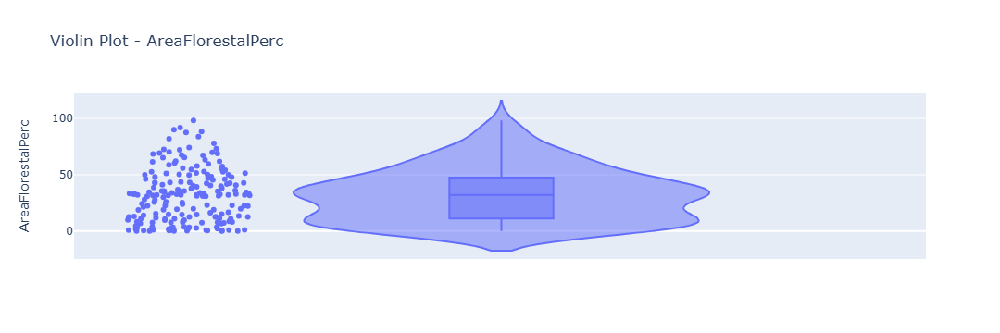

Plotando gráfico para a variável: PrecoGasolina


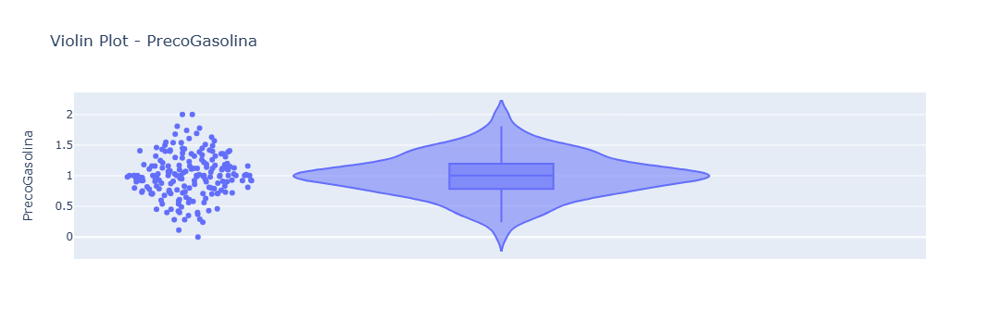

Plotando gráfico para a variável: PIB


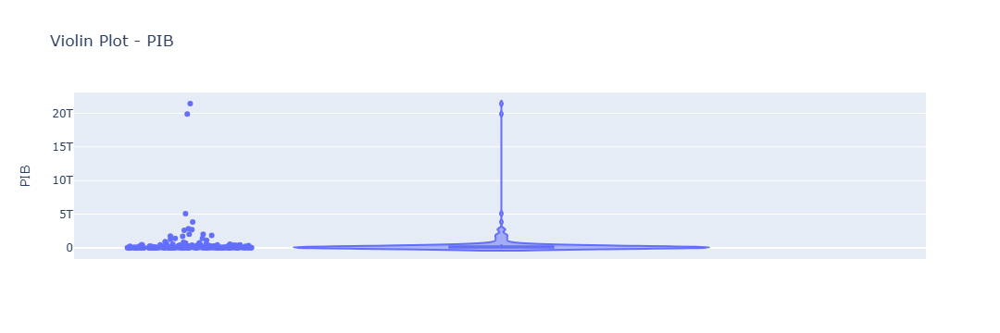

Plotando gráfico para a variável: MatriculaBrutaEnsinoFundamentalPerc


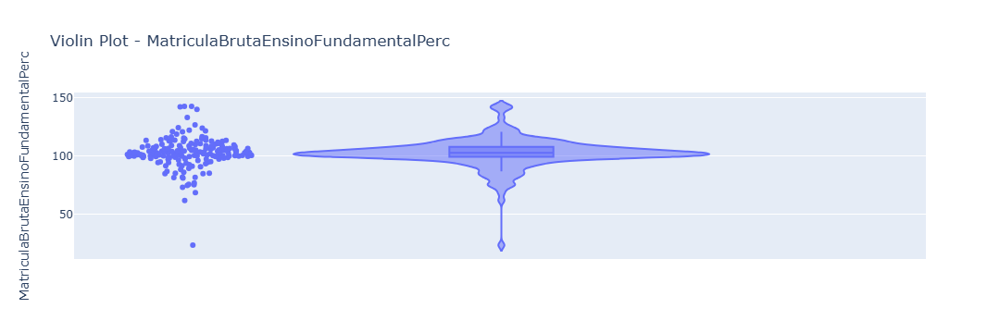

Plotando gráfico para a variável: MatriculaBrutaEnsinoSuperiorPerc


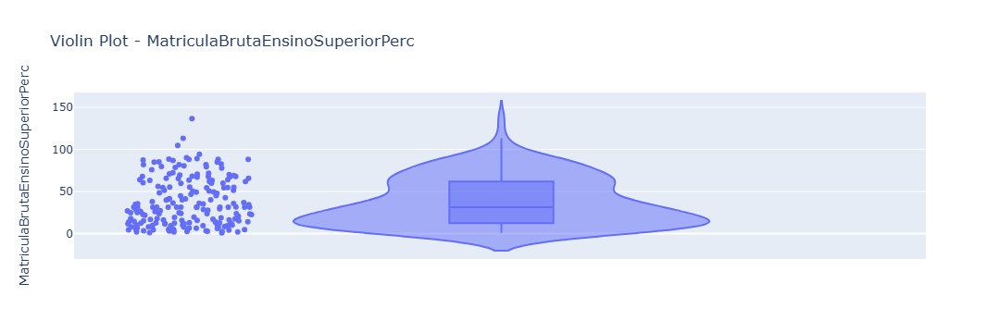

Plotando gráfico para a variável: MortalidadeInfantil


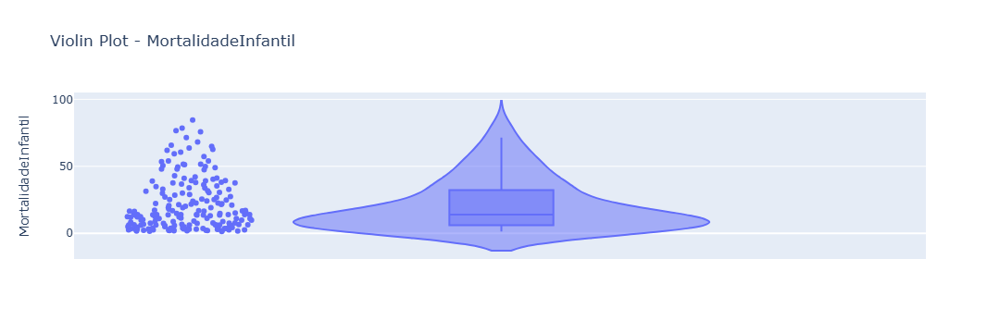

Plotando gráfico para a variável: ExpectativaVida


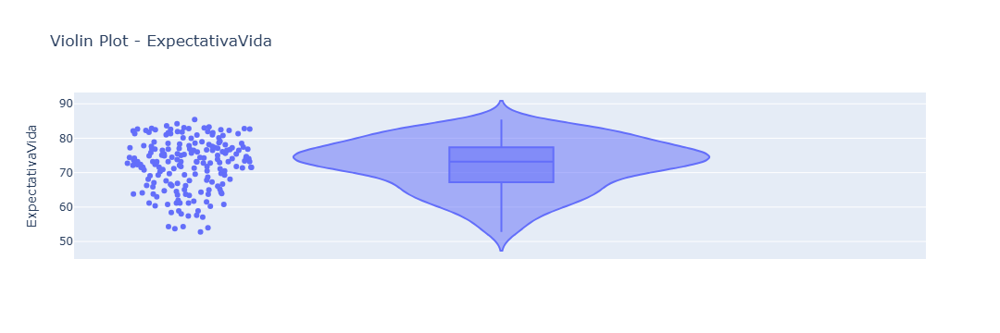

Plotando gráfico para a variável: RazaoMortalidadeMaterna


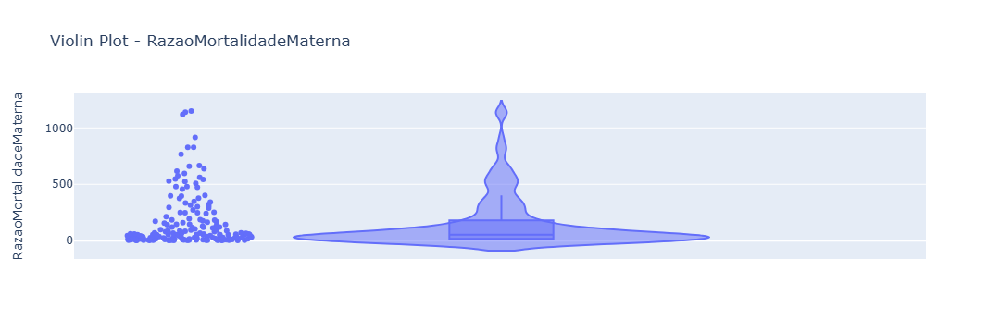

Plotando gráfico para a variável: Salário mínimo


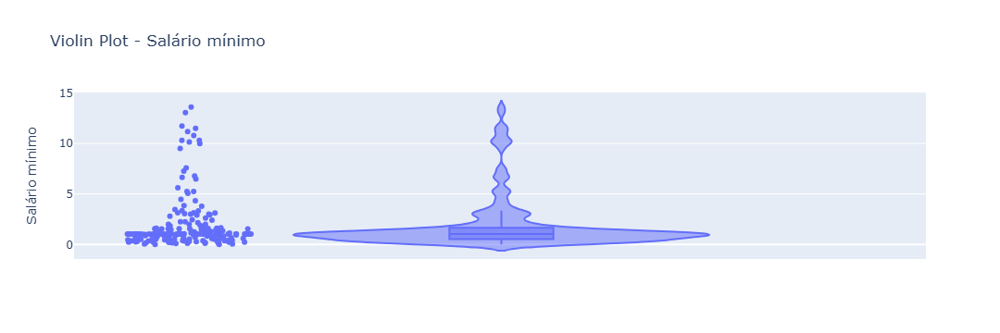

Plotando gráfico para a variável: DespesasSaudePagasPróprioBolsoPerc


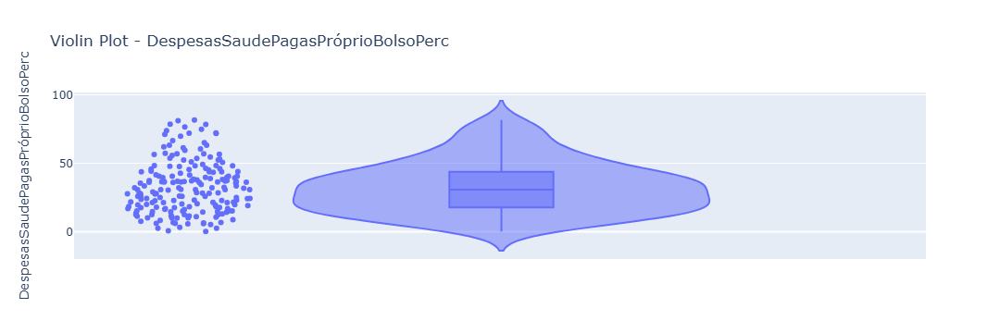

Plotando gráfico para a variável: MedicosPMil


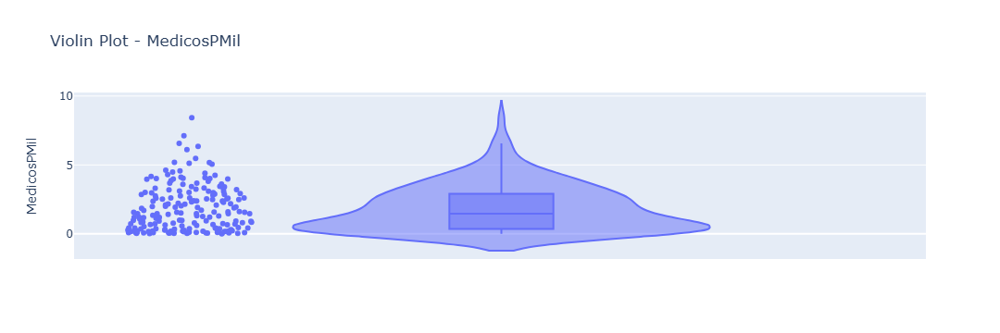

Plotando gráfico para a variável: Populacao


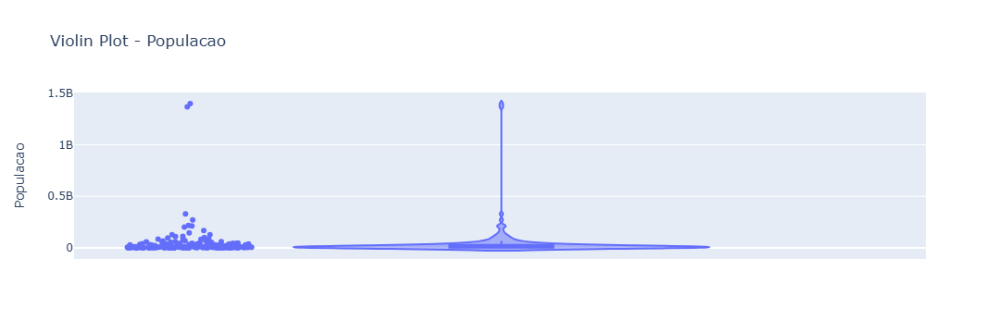

Plotando gráfico para a variável: Populacao/ ParticipacaoForçaTrabalho (%)


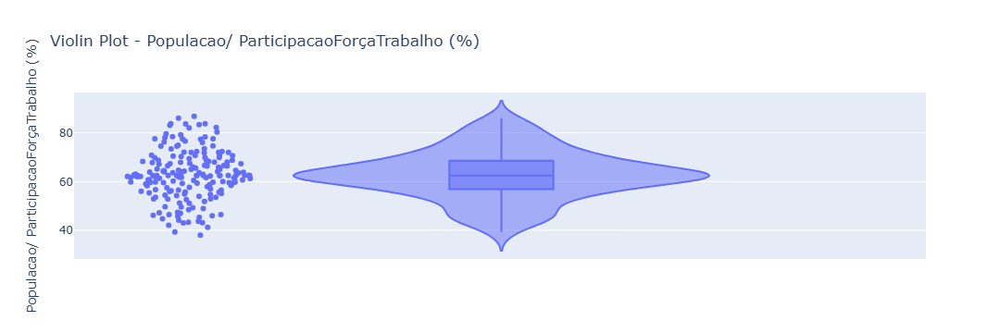

Plotando gráfico para a variável: ReceitaTributariaPerc


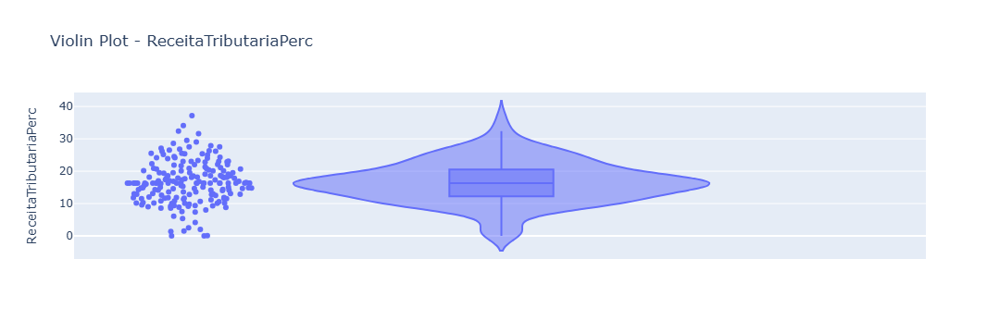

Plotando gráfico para a variável: TaxaTotalImposto


Plotando gráfico para a variável: PopulacaoUrbana


Plotando gráfico para a variável: Urban_population


Plotando gráfico para a variável: Latitude


Plotando gráfico para a variável: Longitude


In [19]:
plot_violin_all(df_f)

# Ajustando variáveis e normalizar variáveis que estão em alta escala

In [20]:
df.head()

,País,DensidadeP/Km2,Abreviacao,TerraAgrícolaPerc,AreaTerrestreKm2,Armed Forces size,TaxaNatalidade,CódigoChamada,Capital/CidadePrincipal,EmissoesCO2,IPC,VariacaoIPC_Perc,Moeda,TaxaFertilidade,AreaFlorestalPerc,PrecoGasolina,PIB,MatriculaBrutaEnsinoFundamentalPerc,MatriculaBrutaEnsinoSuperiorPerc,MortalidadeInfantil,MaiorCidade,ExpectativaVida,RazaoMortalidadeMaterna,Salário mínimo,LínguaOficial,DespesasSaudePagasPróprioBolsoPerc,MedicosPMil,Populacao,Populacao/ ParticipacaoForçaTrabalho (%),ReceitaTributariaPerc,TaxaTotalImposto,PopulacaoUrbana,Urban_population,Latitude,Longitude
0,Afghanistan,60.00,AF,58.10,652230.00,323000.00,32.49,93.00,Kabul,8672.00,149.90,2.30,AFN,4.47,2.10,0.70,19101353833.00,104.00,9.70,47.90,Kabul,64.50,638.00,0.43,Pashto,78.40,0.28,38041754.00,48.90,9.30,71.40,11.12,9797273.00,33.94,67.71
1,Albania,105.00,AL,43.10,28748.00,9000.00,11.78,355.00,Tirana,4536.00,119.05,1.40,ALL,1.62,28.10,1.36,15278077447.00,107.00,55.00,7.80,Tirana,78.50,15.00,1.12,Albanian,56.90,1.20,2854191.00,55.70,18.60,36.60,12.33,1747593.00,41.15,20.17
2,Algeria,18.00,DZ,17.40,2381741.00,317000.00,24.28,213.00,Algiers,150006.00,151.36,2.00,DZD,3.02,0.80,0.28,169988236398.00,109.90,51.40,20.10,Algiers,76.70,112.00,0.95,Arabic,28.10,1.72,43053054.00,41.20,37.20,66.10,11.70,31510100.00,28.03,1.66
3,Andorra,164.00,AD,40.00,468.00,31000.00,7.20,376.00,Andorra la Vella,469.00,125.34,2.30,EUR,1.27,34.00,1.51,3154057987.00,106.40,31.20,2.70,Andorra la Vella,73.20,53.00,6.63,Catalan,36.40,3.33,77142.00,62.45,16.30,37.20,5.36,67873.00,42.51,1.52
4,Angola,26.00,AO,47.50,1246700.00,117000.00,40.73,244.00,Luanda,34693.00,261.73,17.10,AOA,5.52,46.30,0.97,94635415870.00,113.50,9.30,51.60,Luanda,60.80,241.00,0.71,Portuguese,33.40,0.21,31825295.00,77.50,9.20,49.10,6.89,21061025.00,-11.20,17.87


In [21]:
from sklearn.preprocessing import MinMaxScaler
colunas = ['AreaTerrestreKm2', 'Armed Forces size', 'EmissoesCO2', 'Populacao', 'Urban_population']
df_norm = df[colunas]

scaler = MinMaxScaler()
df_norm[colunas] = scaler.fit_transform(df_norm)

In [22]:
df_norm.head()

,AreaTerrestreKm2,Armed Forces size,EmissoesCO2,Populacao,Urban_population
0,0.04,0.11,0.00,0.03,0.01
1,0.00,0.00,0.00,0.00,0.00
2,0.14,0.10,0.02,0.03,0.04
3,0.00,0.01,0.00,0.00,0.00
4,0.07,0.04,0.00,0.02,0.02


In [23]:
df_s = df_f.drop(columns=colunas)

In [24]:
df_final = pd.concat([df_s, df_norm],axis=1)
df_final = df_final.drop(columns='CódigoChamada')
df_final.head()

,DensidadeP/Km2,TerraAgrícolaPerc,TaxaNatalidade,IPC,VariacaoIPC_Perc,TaxaFertilidade,AreaFlorestalPerc,PrecoGasolina,PIB,MatriculaBrutaEnsinoFundamentalPerc,MatriculaBrutaEnsinoSuperiorPerc,MortalidadeInfantil,ExpectativaVida,RazaoMortalidadeMaterna,Salário mínimo,DespesasSaudePagasPróprioBolsoPerc,MedicosPMil,Populacao/ ParticipacaoForçaTrabalho (%),ReceitaTributariaPerc,TaxaTotalImposto,PopulacaoUrbana,Latitude,Longitude,AreaTerrestreKm2,Armed Forces size,EmissoesCO2,Populacao,Urban_population
0,60.00,58.10,32.49,149.90,2.30,4.47,2.10,0.70,19101353833.00,104.00,9.70,47.90,64.50,638.00,0.43,78.40,0.28,48.90,9.30,71.40,11.12,33.94,67.71,0.04,0.11,0.00,0.03,0.01
1,105.00,43.10,11.78,119.05,1.40,1.62,28.10,1.36,15278077447.00,107.00,55.00,7.80,78.50,15.00,1.12,56.90,1.20,55.70,18.60,36.60,12.33,41.15,20.17,0.00,0.00,0.00,0.00,0.00
2,18.00,17.40,24.28,151.36,2.00,3.02,0.80,0.28,169988236398.00,109.90,51.40,20.10,76.70,112.00,0.95,28.10,1.72,41.20,37.20,66.10,11.70,28.03,1.66,0.14,0.10,0.02,0.03,0.04
3,164.00,40.00,7.20,125.34,2.30,1.27,34.00,1.51,3154057987.00,106.40,31.20,2.70,73.20,53.00,6.63,36.40,3.33,62.45,16.30,37.20,5.36,42.51,1.52,0.00,0.01,0.00,0.00,0.00
4,26.00,47.50,40.73,261.73,17.10,5.52,46.30,0.97,94635415870.00,113.50,9.30,51.60,60.80,241.00,0.71,33.40,0.21,77.50,9.20,49.10,6.89,-11.20,17.87,0.07,0.04,0.00,0.02,0.02


# Analisando Modelo 1 com uma variável

In [25]:
lm1 = sm.OLS.from_formula("PIB ~ EmissoesCO2", data=df_final)

In [26]:
model_1 = lm1.fit()

In [27]:
print("Análise do Modelo 1:")
print(model_1.summary())
print("=" * 80)

Análise do Modelo 1:
                            OLS Regression Results                            
Dep. Variable:                    PIB   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     1003.
Date:                Fri, 13 Dec 2024   Prob (F-statistic):           9.78e-78
Time:                        00:50:18   Log-Likelihood:                -5550.1
No. Observations:                 192   AIC:                         1.110e+04
Df Residuals:                     190   BIC:                         1.111e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    6.117e+10   6.42

#1. Visão Geral do Modelo
Modelo: OLS Regression (Regressão Linear Simples).

Variável dependente (Dep. Variable): PIB, ou seja, estamos tentando prever o Produto Interno Bruto (PIB) com base na variável explicativa EmissoesCO2.

R-squared: 0.841

O R² indica que 84,1% da variação no PIB é explicada pela variação nas emissões de CO2.
Isso sugere um modelo bem ajustado, embora nem toda a variabilidade seja explicada.
Adj. R-squared: 0.840

O R² ajustado corrige o R² considerando o número de variáveis no modelo. Como temos apenas uma variável, os valores de R² e R² ajustado são próximos.

#2. Significância Estatística do Modelo
F-statistic: 1003 com p-valor (Prob (F-statistic)) de 9.78e-78.
O teste F avalia a significância global do modelo. O p-valor extremamente pequeno (< 0.001) indica que o modelo é estatisticamente significativo.

#3. Coeficientes
Intercepto (Intercept): 6.114e+10 (61.14 bilhões)

Este é o valor do PIB estimado quando as emissões de CO2 são zero. No contexto econômico, pode não ter interpretação prática, mas é parte do ajuste matemático do modelo.
O p-valor associado ao intercepto (0.342) indica que ele não é estatisticamente significativo.
Coeficiente de EmissoesCO2: 2.405e+06 (2,405,000)

Cada aumento de uma unidade em EmissoesCO2 (presumivelmente toneladas ou similar) está associado a um aumento de 2.405 milhões no PIB.
O p-valor associado (< 0.001) mostra que esse coeficiente é altamente significativo.

#4. Diagnósticos do Modelo
Durbin-Watson: 1.744

Esse valor testa a presença de autocorrelação nos resíduos. Um valor próximo de 2 indica ausência de autocorrelação. Aqui, não há grandes problemas.
Omnibus e Jarque-Bera: Ambos têm p-valores extremamente baixos (0.000), indicando que os resíduos não seguem uma distribuição normal. Isso pode ser uma limitação para interpretar inferências baseadas no modelo.

Cond. No. (Número de Condição): 8.65e+05

Um número de condição alto sugere possível multicolinearidade ou problemas numéricos no modelo. Como temos apenas uma variável explicativa, isso pode ser um sinal de escala inadequada na variável ou necessidade de transformação.

#5. Pontos de Atenção
Distribuição dos Resíduos:

Os testes Omnibus e Jarque-Bera indicam que os resíduos são enviesados e apresentam alta kurtose, o que pode prejudicar a validade de algumas inferências estatísticas.
Número de Condição Alto:

Isso sugere que as variáveis podem estar em escalas muito diferentes. É recomendado revisar a escala de EmissoesCO2 ou normalizar os dados.
Significância Estatística:

Apesar das limitações, o modelo é altamente significativo, e a variável explicativa (EmissoesCO2) tem uma relação forte com o PIB.

#6. Conclusão
A análise de regressão linear indica que existe uma relação significativa entre emissões de CO2 e o PIB, explicando 84,1% da variabilidade do PIB. O coeficiente de EmissoesCO2 sugere que cada unidade adicional nas emissões está associada a um aumento de 2,405 milhões no PIB. No entanto, o modelo apresenta algumas limitações, como resíduos não normalmente distribuídos e um número de condição alto, que devem ser investigados antes de confiar plenamente nos resultados.

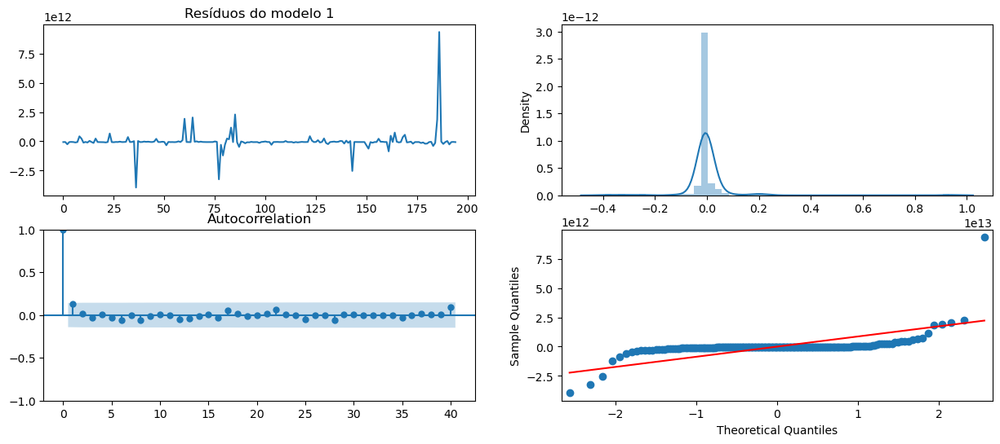

In [28]:
residuos1 = model_1.resid
fig, ax = plt.subplots(2,2,figsize=(15,6))
residuos1.plot(title="Resíduos do modelo 1", ax=ax[0][0])
sns.distplot(residuos1,ax=ax[0][1])
plot_acf(residuos1,lags=40, ax=ax[1][0])
qqplot(residuos1,line='s', ax=ax[1][1]);

In [29]:
estatistica_shapiro,p_shapiro = stats.shapiro(model_1.resid)
print(f'Estatísticas de teste: {format(estatistica_shapiro)}')
print('p-valor: {}'.format(p_shapiro))

Estatísticas de teste: 0.3328790068626404
p-valor: 5.255282882207913e-26


O teste estatístico rejeita a hipótese nula de normalidade para os resíduos. Isso indica que os resíduos do modelo apresentam desvios significativos da distribuição normal, o que pode impactar a validade de inferências estatísticas e sugerir a necessidade de ajustes no modelo.

Text(0.5, 1.0, 'Homocedasticidade - Modelo 1 - Full')

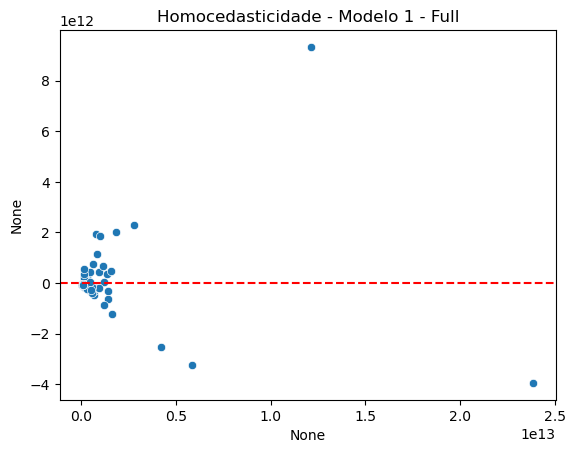

In [30]:
sns.scatterplot(x=model_1.fittedvalues, y=residuos1)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homocedasticidade - Modelo 1 - Full')

In [31]:
estatistica, p, f, fp = het_breuschpagan(model_1.resid, model_1.model.exog)
print(f'Estatísticas de teste: {format(estatistica)}')
print(f'p-valor: {p}')
print(f'f-valor: {fp}')
print(f'f_p-valor: {f}')

Estatísticas de teste: 69.48497373629914
p-valor: 7.699888750893918e-17
f-valor: 2.774390826811894e-20
f_p-valor: 107.75939419447694


In [32]:
y = df_f['PIB']

Text(0, 0.5, 'Resíduos Padronizados')

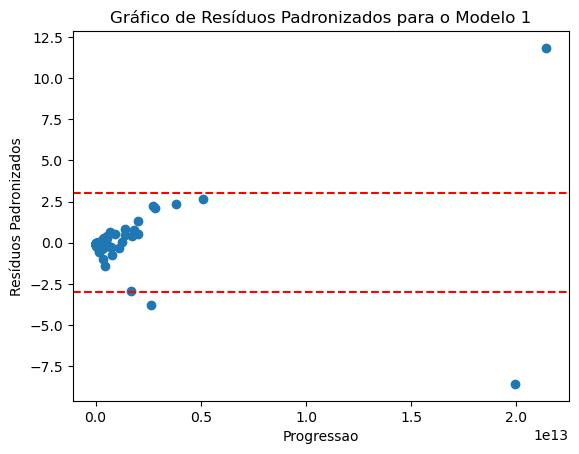

In [33]:
residuos_padronizados = model_1.get_influence().resid_studentized_internal

plt.scatter(y, residuos_padronizados)
plt.axhline(y=3, color='r', linestyle='--')
plt.axhline(y=-3, color='r', linestyle='--')
plt.title(f'Gráfico de Resíduos Padronizados para o Modelo 1')
plt.xlabel('Progressao')
plt.ylabel('Resíduos Padronizados')

In [34]:
results = []
results.append({
    'Modelo': 'Modelo 1',
    'MAE': np.mean(np.abs(y - model_1.predict())),
    'MSE': np.mean((y - model_1.predict())**2),
    'AIC': model_1.aic,
    'BIC': model_1.bic,
    'R²': model_1.rsquared
})

In [35]:
results_df = pd.DataFrame(results)

# Imprimir a tabela de resultados
print(results_df)

     Modelo             MAE                         MSE      AIC      BIC   R²
0  Modelo 1 257607933526.33 751089774557051465236480.00 11104.23 11110.74 0.84


### Padronizando apenas variáveis Preditora, não conseguimos obter resultados diferentes, pois a variável alvo está em uma escala muito discrepante, para solucionar esse problema, vamos normalizar a variável alvo através da transformação de Box-Cox

In [36]:
from scipy.stats import boxcox

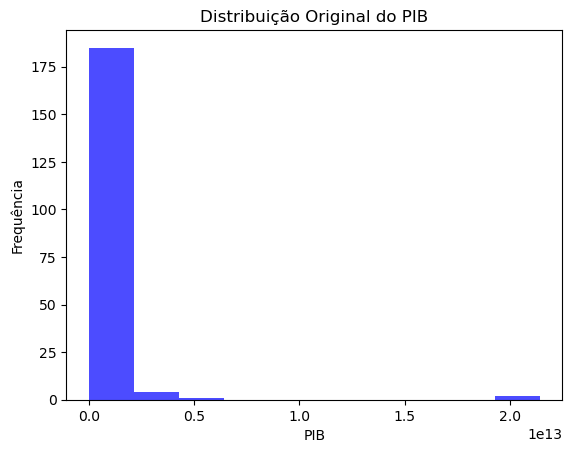

In [37]:
plt.hist(df_final['PIB'], bins=10, color='blue', alpha=0.7)
plt.title("Distribuição Original do PIB")
plt.xlabel("PIB")
plt.ylabel("Frequência")
plt.show()

In [38]:
# Aplicar a transformação de Box-Cox

df_final['PIB_BoxCox'], lambda_bc = boxcox(df_final['PIB'])

print(f"Valor de lambda estimado: {lambda_bc}")
print("Dados após transformação de Box-Cox:")

Valor de lambda estimado: 0.0022703164509503175
Dados após transformação de Box-Cox:


In [39]:
df_final.head(3)

,DensidadeP/Km2,TerraAgrícolaPerc,TaxaNatalidade,IPC,VariacaoIPC_Perc,TaxaFertilidade,AreaFlorestalPerc,PrecoGasolina,PIB,MatriculaBrutaEnsinoFundamentalPerc,MatriculaBrutaEnsinoSuperiorPerc,MortalidadeInfantil,ExpectativaVida,RazaoMortalidadeMaterna,Salário mínimo,DespesasSaudePagasPróprioBolsoPerc,MedicosPMil,Populacao/ ParticipacaoForçaTrabalho (%),ReceitaTributariaPerc,TaxaTotalImposto,PopulacaoUrbana,Latitude,Longitude,AreaTerrestreKm2,Armed Forces size,EmissoesCO2,Populacao,Urban_population,PIB_BoxCox
0,60.00,58.10,32.49,149.90,2.30,4.47,2.10,0.70,19101353833.00,104.00,9.70,47.90,64.50,638.00,0.43,78.40,0.28,48.90,9.30,71.40,11.12,33.94,67.71,0.04,0.11,0.00,0.03,0.01,24.32
1,105.00,43.10,11.78,119.05,1.40,1.62,28.10,1.36,15278077447.00,107.00,55.00,7.80,78.50,15.00,1.12,56.90,1.20,55.70,18.60,36.60,12.33,41.15,20.17,0.00,0.00,0.00,0.00,0.00,24.09
2,18.00,17.40,24.28,151.36,2.00,3.02,0.80,0.28,169988236398.00,109.90,51.40,20.10,76.70,112.00,0.95,28.10,1.72,41.20,37.20,66.10,11.70,28.03,1.66,0.14,0.10,0.02,0.03,0.04,26.63


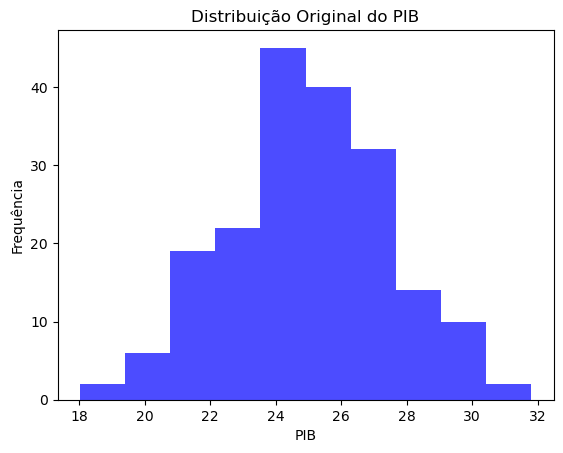

In [40]:
plt.hist(df_final['PIB_BoxCox'], bins=10, color='blue', alpha=0.7)
plt.title("Distribuição Original do PIB")
plt.xlabel("PIB")
plt.ylabel("Frequência")
plt.show()

### Agora vamos refazer o teste usando a variável Target normalizada 

In [41]:
lm2 = sm.OLS.from_formula("PIB_BoxCox ~ EmissoesCO2", data=df_final)

In [42]:
model_2 = lm2.fit()

In [43]:
print("Análise do Modelo 2:")
print(model_2.summary())
print("=" * 80)

Análise do Modelo 2:
                            OLS Regression Results                            
Dep. Variable:             PIB_BoxCox   R-squared:                       0.166
Model:                            OLS   Adj. R-squared:                  0.162
Method:                 Least Squares   F-statistic:                     37.94
Date:                Fri, 13 Dec 2024   Prob (F-statistic):           4.27e-09
Time:                        00:52:28   Log-Likelihood:                -430.13
No. Observations:                 192   AIC:                             864.3
Df Residuals:                     190   BIC:                             870.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      24.8179      0

### Analisando as transformações realizadas podemos perceber que o p_valor continuar significativo, mesmo perdendo perfomance no R2

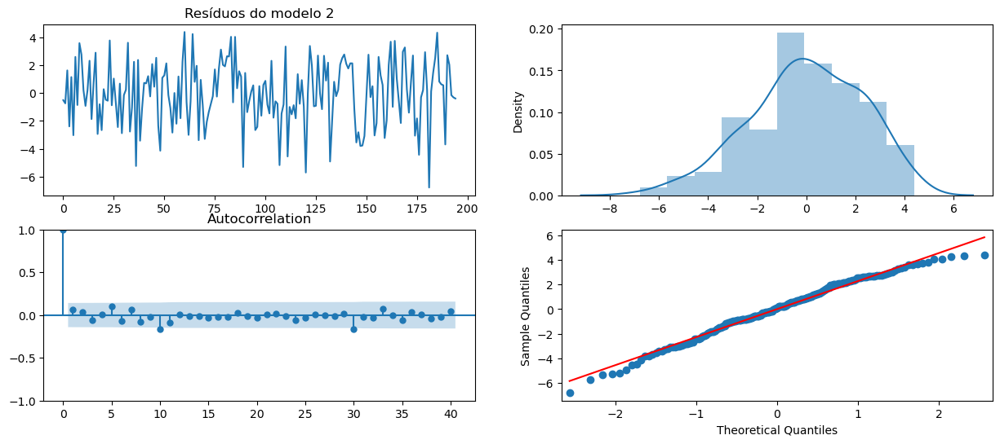

In [44]:
residuos2 = model_2.resid
fig, ax = plt.subplots(2,2,figsize=(15,6))
residuos2.plot(title="Resíduos do modelo 2", ax=ax[0][0])
sns.distplot(residuos2,ax=ax[0][1])
plot_acf(residuos2,lags=40, ax=ax[1][0])
qqplot(residuos2,line='s', ax=ax[1][1]);

Text(0.5, 1.0, 'Homocedasticidade - Modelo 1 - Full')

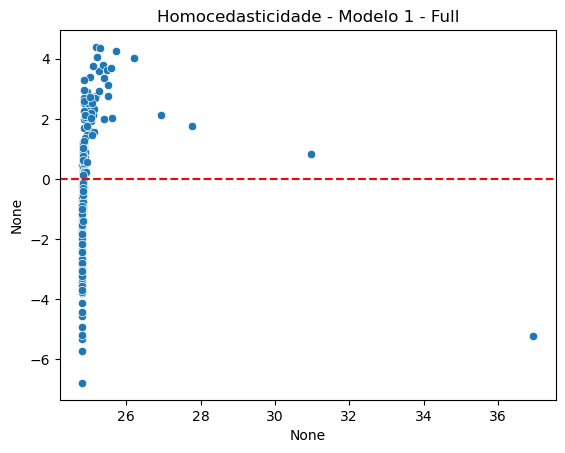

In [45]:
sns.scatterplot(x=model_2.fittedvalues, y=residuos2)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homocedasticidade - Modelo 1 - Full')

In [46]:
estatistica, p, f, fp = het_breuschpagan(model_2.resid, model_2.model.exog)
print(f'Estatísticas de teste: {format(estatistica)}')
print(f'p-valor: {p}')
print(f'f-valor: {fp}')
print(f'f_p-valor: {f}')

Estatísticas de teste: 10.167699377082123
p-valor: 0.0014292250583801294
f-valor: 0.0013224278873645446
f_p-valor: 10.624420826373873


Text(0, 0.5, 'Resíduos Padronizados')

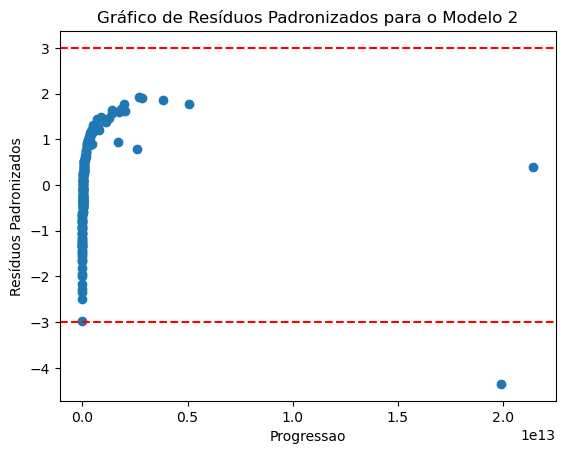

In [47]:
residuos_padronizados = model_2.get_influence().resid_studentized_internal

plt.scatter(y, residuos_padronizados)
plt.axhline(y=3, color='r', linestyle='--')
plt.axhline(y=-3, color='r', linestyle='--')
plt.title(f'Gráfico de Resíduos Padronizados para o Modelo 2')
plt.xlabel('Progressao')
plt.ylabel('Resíduos Padronizados')

In [48]:
results.append({
    'Modelo': 'Modelo 2',
    'MAE': np.mean(np.abs(y - model_2.predict())),
    'MSE': np.mean((y - model_2.predict())**2),
    'AIC': model_2.aic,
    'BIC': model_2.bic,
    'R²': model_2.rsquared
})

In [49]:
results_df = pd.DataFrame(results)

# Imprimir a tabela de resultados
print(results_df)

     Modelo             MAE                          MSE      AIC      BIC  \
0  Modelo 1 257607933526.33  751089774557051465236480.00 11104.23 11110.74   
1  Modelo 2 479779583066.15 4947334997706014585782272.00   864.25   870.77   

    R²  
0 0.84  
1 0.17  


### Os redultados dos resíduos estão maiores, mas configuração dos gráficos estão fazendo mais sentido agora 

# Regressão Linear mutipla

In [50]:
#Variáveis independentes
X = df_final.drop(['PIB','PIB_BoxCox'],axis=1)
y = df_final['PIB_BoxCox']

In [51]:
modelo3 = (sm.OLS(y,sm.add_constant(X)).fit())
modelo3.summary(title='Sumário do modelo')

<class 'statsmodels.iolib.summary.Summary'>
"""
                              Sumário do modelo                               
==============================================================================
Dep. Variable:             PIB_BoxCox   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.598
Method:                 Least Squares   F-statistic:                     11.53
Date:                Fri, 13 Dec 2024   Prob (F-statistic):           9.25e-26
Time:                        00:53:09   Log-Likelihood:                -345.47
No. Observations:                 192   AIC:                             746.9
Df Residuals:                     164   BIC:                             838.2
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                        7.7708      4.528      1.716      0.088      -1.169      16.711
DensidadeP/Km2                              -0.0023      0.001     -2.690      0.008      -0.004      -0.001
TerraAgrícolaPerc                            0.0154      0.007      2.222      0.028       0.002       0.029
TaxaNatalidade                               0.1138      0.082      1.381      0.169      -0.049       0.276
IPC                                         -0.0005      0.001     -0.714      0.476      -0.002       0.001
VariacaoIPC_Perc                             0.0082      0.012      0.697      0.487      -0.015       0.031
TaxaFertilidade                             -0.4980      0.582     -0.855      0.394      -1.648       0.652
AreaFlorestalPerc                           -0.0016      0.006     -0.256      0.798      -0.014       0.011
PrecoGasolina                               -0.7353      0.432     -1.701      0.091      -1.589       0.118
MatriculaBrutaEnsinoFundamentalPerc          0.0081      0.010      0.794      0.429      -0.012       0.028
MatriculaBrutaEnsinoSuperiorPerc             0.0234      0.007      3.315      0.001       0.009       0.037
MortalidadeInfantil                          0.0198      0.020      1.003      0.317      -0.019       0.059
ExpectativaVida                              0.1973      0.051      3.882      0.000       0.097       0.298
RazaoMortalidadeMaterna                      0.0015      0.001      1.265      0.208      -0.001       0.004
Salário mínimo                               0.1906      0.056      3.409      0.001       0.080       0.301
DespesasSaudePagasPróprioBolsoPerc           0.0045      0.008      0.537      0.592      -0.012       0.021
MedicosPMil                                  0.0864      0.125      0.690      0.491      -0.161       0.334
Populacao/ ParticipacaoForçaTrabalho (%)     0.0060      0.015      0.395      0.693      -0.024       0.036
ReceitaTributariaPerc                       -0.0690      0.022     -3.111      0.002      -0.113      -0.025
TaxaTotalImposto                            -0.0097      0.007     -1.441      0.152      -0.023       0.004
PopulacaoUrbana                             -0.0051      0.030     -0.168      0.867      -0.065       0.054
Latitude                                     0.0108      0.007      1.628      0.105      -0.002       0.024
Longitude                                    0.0005      0.002      0.278      0.781      -0.003       0.004
AreaTerrestreKm2                             1.1938      1.525      0.783      0.435      -1.817       4.204
Armed Forces size                            5.3809      2.385      2.256      0.025       0.671      10.091
EmissoesCO2                    

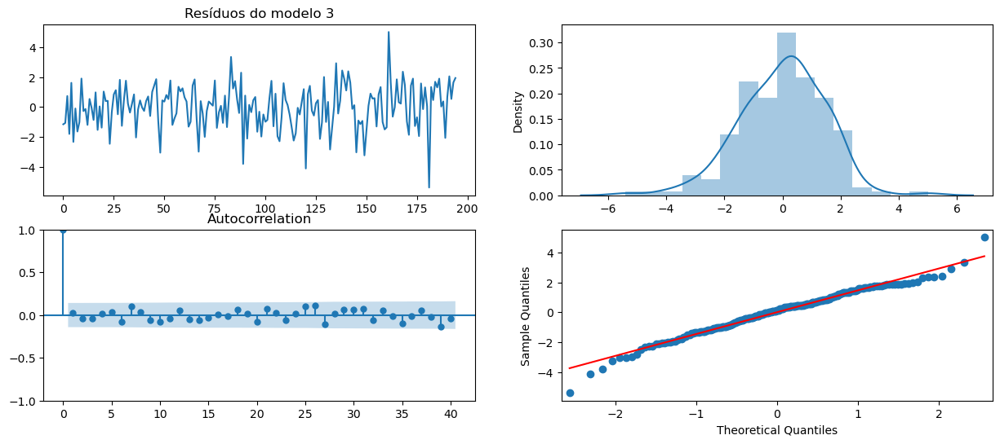

In [52]:
residuos3 = modelo3.resid
fig, ax = plt.subplots(2,2,figsize=(15,6))
residuos3.plot(title="Resíduos do modelo 3", ax=ax[0][0])
sns.distplot(residuos3,ax=ax[0][1])
plot_acf(residuos3,lags=40, ax=ax[1][0])
qqplot(residuos3,line='s', ax=ax[1][1]);

In [53]:
estatistica_shapiro,p_shapiro = stats.shapiro(modelo3.resid)
print(f'Estatísticas de teste: {format(estatistica_shapiro)}')
print('p-valor: {}'.format(p_shapiro))

Estatísticas de teste: 0.9845355749130249
p-valor: 0.03303335979580879


Text(0.5, 1.0, 'Homocedasticidade - Modelo 3 - Full')

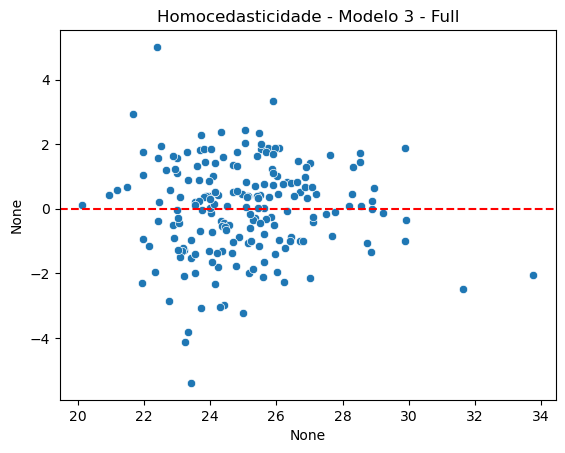

In [54]:
sns.scatterplot(x=modelo3.fittedvalues, y=residuos3)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homocedasticidade - Modelo 3 - Full')

In [55]:
estatistica, p, f, fp = het_breuschpagan(modelo3.resid, modelo3.model.exog)
print(f'Estatísticas de teste: {format(estatistica)}')
print(f'p-valor: {p}')
print(f'f-valor: {fp}')
print(f'f_p-valor: {f}')

Estatísticas de teste: 37.852921168948164
p-valor: 0.08021504153883048
f-valor: 0.06787334879373746
f_p-valor: 1.4915718730698495


Text(0, 0.5, 'Resíduos Padronizados')

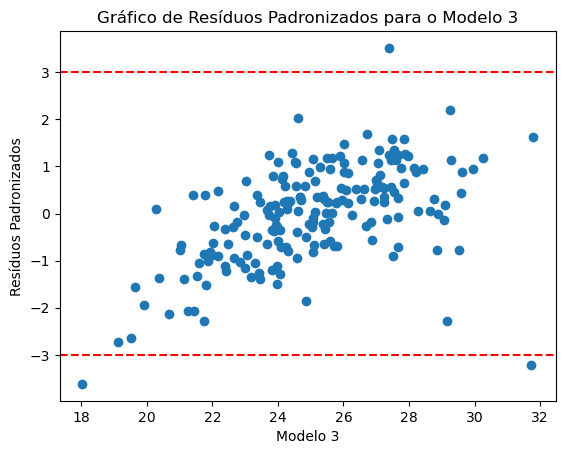

In [56]:
residuos_padronizados = modelo3.get_influence().resid_studentized_internal

plt.scatter(y, residuos_padronizados)
plt.axhline(y=3, color='r', linestyle='--')
plt.axhline(y=-3, color='r', linestyle='--')
plt.title(f'Gráfico de Resíduos Padronizados para o Modelo 3')
plt.xlabel('Modelo 3')
plt.ylabel('Resíduos Padronizados')

In [57]:
results.append({
    'Modelo': 'Modelo 3',
    'MAE': np.mean(np.abs(y - modelo3.predict())),
    'MSE': np.mean((y - modelo3.predict())**2),
    'AIC': modelo3.aic,
    'BIC': modelo3.bic,
    'R²': modelo3.rsquared
})

In [58]:
results_df = pd.DataFrame(results)

# Imprimir a tabela de resultados
print(results_df)

     Modelo             MAE                          MSE      AIC      BIC  \
0  Modelo 1 257607933526.33  751089774557051465236480.00 11104.23 11110.74   
1  Modelo 2 479779583066.15 4947334997706014585782272.00   864.25   870.77   
2  Modelo 3            1.15                         2.14   746.95   838.16   

    R²  
0 0.84  
1 0.17  
2 0.65  


### Filtrando variáveis com p_valor insiguinificantes

In [59]:
def filtrar_variaveis_insignificantes(modelo, alpha=0.05):

    p_values = modelo.pvalues
    
    variaveis_insignificantes = p_values[p_values < alpha].index.tolist()
    
    return variaveis_insignificantes

In [60]:
variaveis_insignificantes = filtrar_variaveis_insignificantes(modelo3, alpha=0.05)
print("\nVariáveis com P>|t| > 0.05 (Significativas):")
print(variaveis_insignificantes)


Variáveis com P>|t| > 0.05 (Significativas):
['DensidadeP/Km2', 'TerraAgrícolaPerc', 'MatriculaBrutaEnsinoSuperiorPerc', 'ExpectativaVida', 'Salário mínimo', 'ReceitaTributariaPerc', 'Armed Forces size', 'EmissoesCO2', 'Populacao', 'Urban_population']


### Criando modelo somente com variáveis significativas

In [61]:
colunas = ['DensidadeP/Km2', 'TerraAgrícolaPerc', 'MatriculaBrutaEnsinoSuperiorPerc', 'ExpectativaVida', 'Salário mínimo', 'ReceitaTributariaPerc', 'Armed Forces size', 'EmissoesCO2', 'Populacao', 'Urban_population']

In [62]:
X = df_final[colunas]
y = df_final['PIB_BoxCox']

In [63]:
modelo4 = (sm.OLS(y,sm.add_constant(X)).fit())
modelo4.summary(title='Sumário do modelo')

<class 'statsmodels.iolib.summary.Summary'>
"""
                              Sumário do modelo                               
==============================================================================
Dep. Variable:             PIB_BoxCox   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.585
Method:                 Least Squares   F-statistic:                     27.90
Date:                Fri, 13 Dec 2024   Prob (F-statistic):           9.47e-32
Time:                        00:53:56   Log-Likelihood:                -358.06
No. Observations:                 192   AIC:                             738.1
Df Residuals:                     181   BIC:                             773.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               17.9973      1.700     10.587      0.000      14.643      21.351
DensidadeP/Km2                      -0.0029      0.001     -3.507      0.001      -0.005      -0.001
TerraAgrícolaPerc                    0.0168      0.006      2.879      0.004       0.005       0.028
MatriculaBrutaEnsinoSuperiorPerc     0.0223      0.006      3.605      0.000       0.010       0.035
ExpectativaVida                      0.0931      0.025      3.658      0.000       0.043       0.143
Salário mínimo                       0.1700      0.052      3.299      0.001       0.068       0.272
ReceitaTributariaPerc               -0.0995      0.020     -5.042      0.000      -0.138      -0.061
Armed Forces size                    6.8793      2.109      3.262      0.001       2.719      11.040
EmissoesCO2                        -18.6716      4.899     -3.811      0.000     -28.338      -9.005
Populacao                          -17.1310      5.406     -3.169      0.002     -27.798      -6.464
Urban_population                    37.5678      9.115      4.122      0.000      19.582      55.553
==============================================================================
Omnibus:                       16.736   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.130
Skew:                          -0.655   Prob(JB):                     7.02e-05
Kurtosis:                       3.822   Cond. No.                     2.00e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  2e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

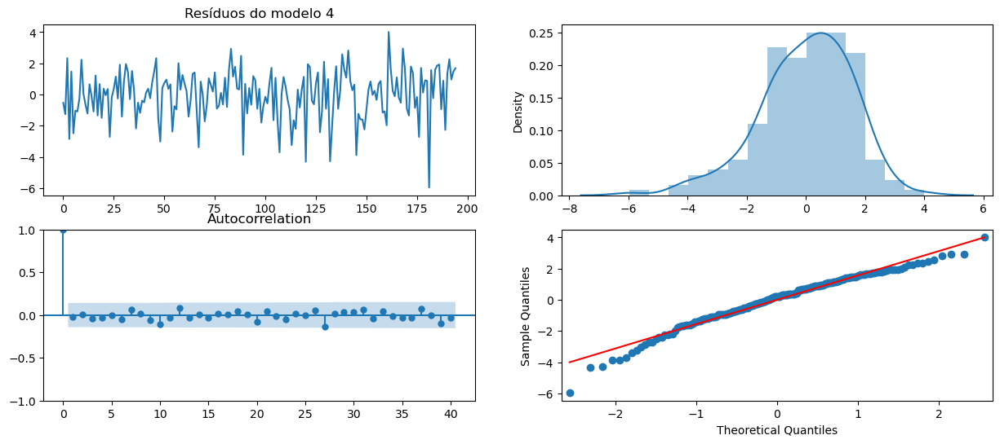

In [64]:
residuos4 = modelo4.resid
fig, ax = plt.subplots(2,2,figsize=(15,6))
residuos4.plot(title="Resíduos do modelo 4", ax=ax[0][0])
sns.distplot(residuos4,ax=ax[0][1])
plot_acf(residuos4,lags=40, ax=ax[1][0])
qqplot(residuos4,line='s', ax=ax[1][1]);

In [65]:
estatistica_shapiro,p_shapiro = stats.shapiro(modelo4.resid)
print(f'Estatísticas de teste: {format(estatistica_shapiro)}')
print('p-valor: {}'.format(p_shapiro))

Estatísticas de teste: 0.9749734997749329
p-valor: 0.001623684074729681


Text(0.5, 1.0, 'Homocedasticidade - Modelo 4 - Full')

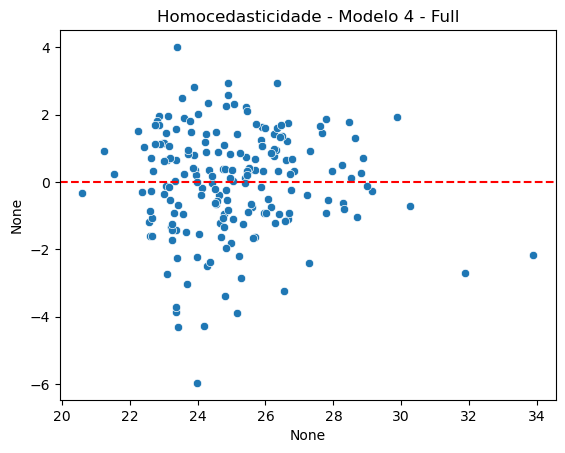

In [66]:
sns.scatterplot(x=modelo4.fittedvalues, y=residuos4)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homocedasticidade - Modelo 4 - Full')

In [67]:
estatistica, p, f, fp = het_breuschpagan(modelo4.resid, modelo4.model.exog)
print(f'Estatísticas de teste: {format(estatistica)}')
print(f'p-valor: {p}')
print(f'f-valor: {fp}')
print(f'f_p-valor: {f}')

Estatísticas de teste: 13.275435746303309
p-valor: 0.20867703041186877
f-valor: 0.2099270395130193
f_p-valor: 1.344445225039176


Text(0, 0.5, 'Resíduos Padronizados')

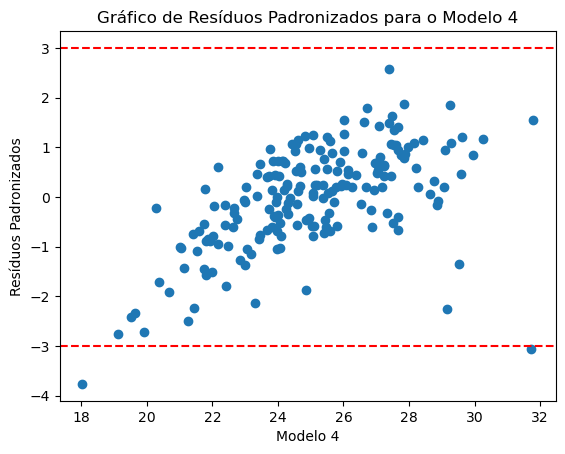

In [68]:
residuos_padronizados = modelo4.get_influence().resid_studentized_internal

plt.scatter(y, residuos_padronizados)
plt.axhline(y=3, color='r', linestyle='--')
plt.axhline(y=-3, color='r', linestyle='--')
plt.title(f'Gráfico de Resíduos Padronizados para o Modelo 4')
plt.xlabel('Modelo 4')
plt.ylabel('Resíduos Padronizados')

In [69]:
results.append({
    'Modelo': 'Modelo 4',
    'MAE': np.mean(np.abs(y - modelo4.predict())),
    'MSE': np.mean((y - modelo4.predict())**2),
    'AIC': modelo4.aic,
    'BIC': modelo4.bic,
    'R²': modelo4.rsquared
})

In [70]:
results_df = pd.DataFrame(results)

# Imprimir a tabela de resultados
print(results_df)

     Modelo             MAE                          MSE      AIC      BIC  \
0  Modelo 1 257607933526.33  751089774557051465236480.00 11104.23 11110.74   
1  Modelo 2 479779583066.15 4947334997706014585782272.00   864.25   870.77   
2  Modelo 3            1.15                         2.14   746.95   838.16   
3  Modelo 4            1.23                         2.44   738.11   773.95   

    R²  
0 0.84  
1 0.17  
2 0.65  
3 0.61  


### Seleção de variáveis através do stepwise_model

In [71]:
# Divisão da base - Treino e Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [72]:
def calculate_aic(model, X, y):
    n = len(y)
    k = X.shape[1] + 1  
    y_pred = model.predict(X)
    mse = mean_squared_error(y, y_pred)
    aic = n * np.log(mse) + 2 * k
    return aic

In [73]:
def forward_backward_stepwise_selection(X, y):
    selected_features = [] # lista vazia que armazenará as variáveis selecionadas
    stepwise_model = LinearRegression() # modelo de regressão a ser usado
    best_aic = float('inf') # variável que armazenará o melhor AIC
    #(lembrando que quanto menor o AIC, melhor o modelo)
    
    # Passo Forward
    while True: #Este loop continua até que não haja mais variáveis para serem testadas.
        features_to_test = [feature for feature in X.columns if feature not in selected_features]
        if not features_to_test: #Lista das variáveis que ainda não foram selecionadas.
            break
        
        best_feature = None
        best_model = None
        best_aic_with_new_feature = float('inf')
        
        #Para cada variável em features_to_test, o modelo linear é ajustado utilizando essa variável em 
        #conjunto com as variáveis já selecionadas.
        for feature in features_to_test:
            # Ajusta o modelo com a nova variável adicionada
            features_selected = selected_features + [feature]
            stepwise_model.fit(X[features_selected], y)
            # Calcula o AIC
            aic = calculate_aic(stepwise_model, X[features_selected], y)
            # Seleciona a variável com menor AIC
            if aic < best_aic_with_new_feature:
                best_aic_with_new_feature = aic
                best_feature = feature
                best_model = stepwise_model
                
        if best_aic_with_new_feature >= best_aic:
            break
        
        selected_features.append(best_feature)
        best_aic = best_aic_with_new_feature
    
    # Passo Backward
    while True:
        if not selected_features:
            break
        
        worst_feature = None
        worst_model = None
        best_aic_without_feature = float('inf')
        
        for feature in selected_features:
            # Ajusta o modelo sem a variável atual
            features_removed = [f for f in selected_features if f != feature]
            stepwise_model.fit(X[features_removed], y)
            # Calcula o AIC
            aic = calculate_aic(stepwise_model, X[features_removed], y)
            # Seleciona a variável com menor AIC
            if aic < best_aic_without_feature:
                best_aic_without_feature = aic
                worst_feature = feature
                worst_model = stepwise_model
        
        if best_aic_without_feature >= best_aic:
            break
        
        selected_features.remove(worst_feature)
        best_aic = best_aic_without_feature
    
    return selected_features

In [74]:
stepwise_model = LinearRegression()

selected_features = forward_backward_stepwise_selection(X_train,y_train )

print("Variáveis Selecionadas:", selected_features)

Variáveis Selecionadas: ['MatriculaBrutaEnsinoSuperiorPerc', 'Armed Forces size', 'ReceitaTributariaPerc', 'Salário mínimo', 'DensidadeP/Km2', 'ExpectativaVida', 'TerraAgrícolaPerc']


In [77]:
stepwise = ['MatriculaBrutaEnsinoSuperiorPerc', 'Armed Forces size', 'ReceitaTributariaPerc', 'Salário mínimo', 'DensidadeP/Km2', 'ExpectativaVida', 'TerraAgrícolaPerc']

In [78]:
X = df_final[stepwise]
y = df_final['PIB_BoxCox']

In [79]:
modelo5 = (sm.OLS(y,sm.add_constant(X)).fit())
modelo5.summary(title='Sumário do modelo')

<class 'statsmodels.iolib.summary.Summary'>
"""
                              Sumário do modelo                               
==============================================================================
Dep. Variable:             PIB_BoxCox   R-squared:                       0.568
Model:                            OLS   Adj. R-squared:                  0.552
Method:                 Least Squares   F-statistic:                     34.63
Date:                Fri, 13 Dec 2024   Prob (F-statistic):           1.68e-30
Time:                        00:55:42   Log-Likelihood:                -366.92
No. Observations:                 192   AIC:                             749.8
Df Residuals:                     184   BIC:                             775.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               17.6364      1.760     10.023      0.000      14.165      21.108
MatriculaBrutaEnsinoSuperiorPerc     0.0225      0.006      3.535      0.001       0.010       0.035
Armed Forces size                    7.7939      1.063      7.331      0.000       5.696       9.891
ReceitaTributariaPerc               -0.1063      0.020     -5.216      0.000      -0.147      -0.066
Salário mínimo                       0.1664      0.053      3.130      0.002       0.062       0.271
DensidadeP/Km2                      -0.0031      0.001     -3.622      0.000      -0.005      -0.001
ExpectativaVida                      0.1007      0.026      3.822      0.000       0.049       0.153
TerraAgrícolaPerc                    0.0188      0.006      3.151      0.002       0.007       0.031
==============================================================================
Omnibus:                       10.919   Durbin-Watson:                   2.058
Prob(Omnibus):                  0.004   Jarque-Bera (JB):               11.365
Skew:                          -0.513   Prob(JB):                      0.00341
Kurtosis:                       3.608   Cond. No.                     3.05e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

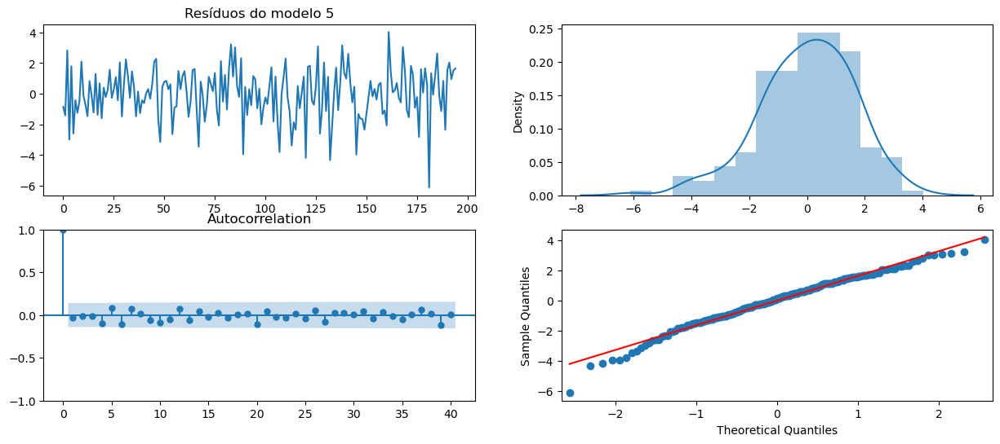

In [80]:
residuos5 = modelo5.resid
fig, ax = plt.subplots(2,2,figsize=(15,6))
residuos5.plot(title="Resíduos do modelo 5", ax=ax[0][0])
sns.distplot(residuos5,ax=ax[0][1])
plot_acf(residuos5,lags=40, ax=ax[1][0])
qqplot(residuos5,line='s', ax=ax[1][1]);

In [81]:
estatistica_shapiro,p_shapiro = stats.shapiro(modelo5.resid)
print(f'Estatísticas de teste: {format(estatistica_shapiro)}')
print('p-valor: {}'.format(p_shapiro))

Estatísticas de teste: 0.9838684797286987
p-valor: 0.02649839222431183


Text(0.5, 1.0, 'Homocedasticidade - Modelo 5 - Full')

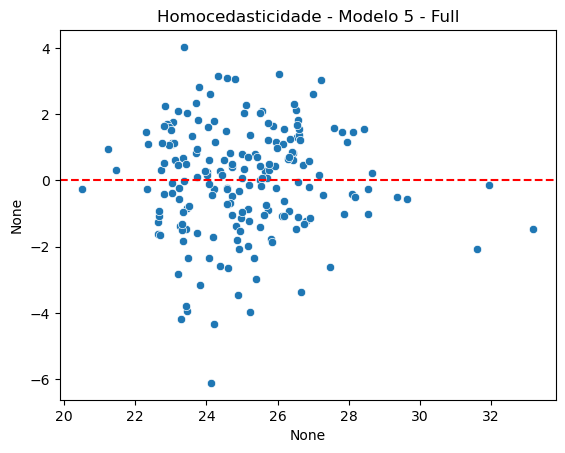

In [82]:
sns.scatterplot(x=modelo5.fittedvalues, y=residuos5)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homocedasticidade - Modelo 5 - Full')

In [83]:
estatistica, p, f, fp = het_breuschpagan(modelo5.resid, modelo5.model.exog)
print(f'Estatísticas de teste: {format(estatistica)}')
print(f'p-valor: {p}')
print(f'f-valor: {fp}')
print(f'f_p-valor: {f}')

Estatísticas de teste: 12.366608486221878
p-valor: 0.08912920367005567
f-valor: 0.08770888227550945
f_p-valor: 1.8096030733082549


Text(0, 0.5, 'Resíduos Padronizados')

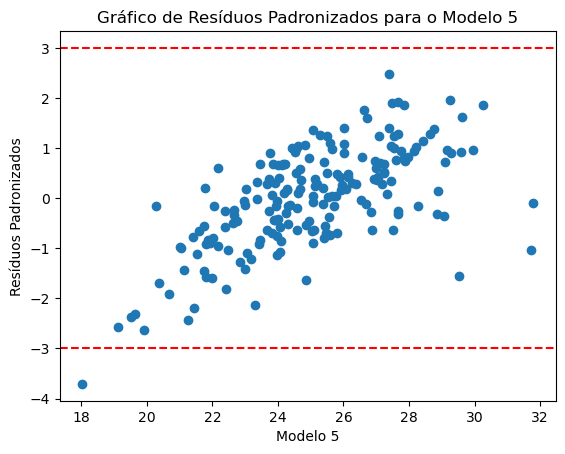

In [84]:
residuos_padronizados = modelo5.get_influence().resid_studentized_internal

plt.scatter(y, residuos_padronizados)
plt.axhline(y=3, color='r', linestyle='--')
plt.axhline(y=-3, color='r', linestyle='--')
plt.title(f'Gráfico de Resíduos Padronizados para o Modelo 5')
plt.xlabel('Modelo 5')
plt.ylabel('Resíduos Padronizados')

In [85]:
results.append({
    'Modelo': 'Modelo 5',
    'MAE': np.mean(np.abs(y - modelo5.predict())),
    'MSE': np.mean((y - modelo5.predict())**2),
    'AIC': modelo5.aic,
    'BIC': modelo5.bic,
    'R²': modelo5.rsquared
})

In [86]:
results_df = pd.DataFrame(results)

# Imprimir a tabela de resultados
print(results_df)

     Modelo             MAE                          MSE      AIC      BIC  \
0  Modelo 1 257607933526.33  751089774557051465236480.00 11104.23 11110.74   
1  Modelo 2 479779583066.15 4947334997706014585782272.00   864.25   870.77   
2  Modelo 3            1.15                         2.14   746.95   838.16   
3  Modelo 4            1.23                         2.44   738.11   773.95   
4  Modelo 5            1.29                         2.68   749.84   775.90   

    R²  
0 0.84  
1 0.17  
2 0.65  
3 0.61  
4 0.57  


## Considerações finais

### O Modelo 4 é o mais indicado com base no AIC e BIC, que são os critérios mais relevantes para seleção de modelos quando o objetivo é balancear ajuste e simplicidade. Embora o 𝑅2 do Modelo 3 seja ligeiramente maior, a diferença não é significativa e o AIC/BIC mais baixos do Modelo 4 indicam que ele ajusta melhor os dados com menor complexidade.